<a href="https://colab.research.google.com/github/areumham/tiny_python_projects/blob/master/result.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install tensorflow==2.15.0


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 475.2/475.2 MB 2.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 49.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 64.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 59.8 MB/s eta 0:00:00
  Attempting uninstall: ml-dtypes
    Found existing installation: ml-dtypes 0.3.2
    Uninstalling ml-dtypes-0.3.2:
      Successfully uninstalled ml-dtypes-0.3.2
  Attempting uninstall: keras
    Found existing installation: keras 3.3.3
    Uninstalling keras-3.3.3:
      Successfully uninstalled keras-3.3.3
  Attempting uninstall: tensorboard
    Found existing installation: tensorboard 2.16.2
    Uninstalling tensorboard-2.16.2:
      Successfully uninstalled tensorboard-2.16.2
  Attempting uninstall: tensorflow
    Found existing installation: tensorflow 2.16.1
    Uninstalling tensorflow-2.16.1:
      Successfully uninstalled tensorflow-2.16.1


In [ ]:
!pip install h5py keras ml-dtypes namex optree tensorboard


In [ ]:
import os

folder_path = '/content/drive/My Drive/gan_checkpoint_epoch_01.h5'

if os.path.isdir(folder_path):
    file_list = os.listdir(folder_path)
    print(file_list)
else:
    file_name = os.path.basename(folder_path)
    print(file_name)


gan_checkpoint_epoch_01.h5


In [ ]:
from google.colab import drive
import os

# 파일 경로 설정
checkpoint_path = '/content/drive/My Drive/gan_checkpoint_epoch_01.h5'

# 파일 존재 여부 확인
if os.path.exists(checkpoint_path):
    print("파일이 존재합니다.")
else:
    print("파일이 존재하지 않습니다. 경로를 확인하세요.")

파일이 존재합니다.


파일이 존재합니다.
Checkpoint 파일이 존재합니다.
1/1 [==============================] - 2s 2s/step


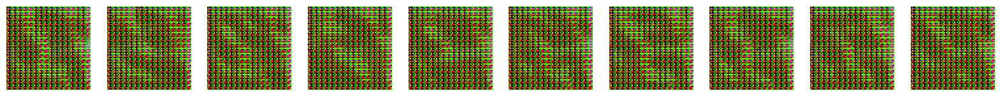

In [ ]:
import os
import warnings
import numpy as np
import matplotlib.pyplot as plt
from keras.optimizers import Adam
from keras.models import Sequential
from keras.layers import Dense, Conv2D, Conv2DTranspose, LeakyReLU
from keras.layers import BatchNormalization, Dropout, Reshape, Flatten
import tensorflow as tf

warnings.filterwarnings('ignore')

# 파일 경로 설정
checkpoint_path = '/content/drive/MyDrive/gan_checkpoint_epoch_01.h5'

# 파일 존재 여부 확인
if os.path.exists(checkpoint_path):
    print("파일이 존재합니다.")
else:
    print("파일이 존재하지 않습니다. 경로를 확인하세요.")

def build_discriminator(image_shape=(64, 64, 3)):
    model = Sequential()
    model.add(Conv2D(128, (3, 3), strides=(2,2), padding="same", input_shape=image_shape))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(128, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(256, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(256, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(512, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Flatten())
    model.add(Dropout(0.4))
    model.add(Dense(1, activation="sigmoid"))
    optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss="binary_crossentropy", optimizer=optimizer, metrics=["accuracy"])
    return model

def build_generator(latent_dim, channels=3):
    model = Sequential()
    model.add(Dense(16 * 16 * 128, input_dim=latent_dim))
    model.add(LeakyReLU(0.2))
    model.add(Reshape((16, 16, 128)))
    model.add(Conv2DTranspose(128, (4, 4), strides=(2, 2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(128, (4, 4), strides=(1, 1), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(64, (4, 4), strides=(2, 2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(64, (4, 4), strides=(1, 1), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(channels, (8, 8), activation='tanh', padding="same"))
    return model

def build_gan(generator, discriminator):
    discriminator.trainable = False
    model = Sequential()
    model.add(generator)
    model.add(discriminator)
    optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss="binary_crossentropy", optimizer=optimizer)
    return model

latent_dim = 100
generator_model = build_generator(latent_dim)
discriminator_model = build_discriminator()
gan_model = build_gan(generator_model, discriminator_model)

# 가중치 로드
if os.path.exists(checkpoint_path):
    print("Checkpoint 파일이 존재합니다.")
    gan_model.load_weights(checkpoint_path)
else:
    print("Checkpoint 파일이 존재하지 않습니다. 경로를 확인하세요.")

# 모델 사용 예시 (노이즈 샘플을 생성하여 이미지를 생성)
def generate_noise_samples(batch_size, latent_dim):
    return np.random.normal(0, 1, (batch_size, latent_dim))

# 노이즈 샘플 생성
noise_samples = generate_noise_samples(10, latent_dim)

# 생성된 이미지
generated_images = generator_model.predict(noise_samples)

# 생성된 이미지 시각화 (예시)
def plot_generated_images(images, n=10):
    plt.figure(figsize=(20, 4))
    for i in range(n):
        plt.subplot(1, n, i + 1)
        plt.imshow((images[i] + 1) / 2)  # 이미지 값을 0-1 범위로 스케일링
        plt.axis('off')
    plt.show()

# 생성된 이미지 플로팅
plot_generated_images(generated_images)


파일이 존재합니다.
Checkpoint 파일이 존재합니다.
1/1 [==============================] - 1s 927ms/step


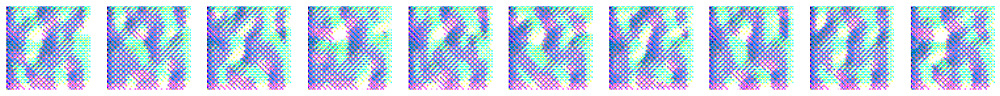

In [ ]:
import os
import warnings
import numpy as np
import matplotlib.pyplot as plt
from keras.optimizers import Adam
from keras.models import Sequential
from keras.layers import Dense, Conv2D, Conv2DTranspose, LeakyReLU
from keras.layers import BatchNormalization, Dropout, Reshape, Flatten
import tensorflow as tf

warnings.filterwarnings('ignore')

# 파일 경로 설정
checkpoint_path = '/content/drive/MyDrive/gan_checkpoint_epoch_02.h5'

# 파일 존재 여부 확인
if os.path.exists(checkpoint_path):
    print("파일이 존재합니다.")
else:
    print("파일이 존재하지 않습니다. 경로를 확인하세요.")

def build_discriminator(image_shape=(64, 64, 3)):
    model = Sequential()
    model.add(Conv2D(128, (3, 3), strides=(2,2), padding="same", input_shape=image_shape))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(128, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(256, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(256, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(512, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Flatten())
    model.add(Dropout(0.4))
    model.add(Dense(1, activation="sigmoid"))
    optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss="binary_crossentropy", optimizer=optimizer, metrics=["accuracy"])
    return model

def build_generator(latent_dim, channels=3):
    model = Sequential()
    model.add(Dense(16 * 16 * 128, input_dim=latent_dim))
    model.add(LeakyReLU(0.2))
    model.add(Reshape((16, 16, 128)))
    model.add(Conv2DTranspose(128, (4, 4), strides=(2, 2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(128, (4, 4), strides=(1, 1), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(64, (4, 4), strides=(2, 2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(64, (4, 4), strides=(1, 1), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(channels, (8, 8), activation='tanh', padding="same"))
    return model

def build_gan(generator, discriminator):
    discriminator.trainable = False
    model = Sequential()
    model.add(generator)
    model.add(discriminator)
    optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss="binary_crossentropy", optimizer=optimizer)
    return model

latent_dim = 100
generator_model = build_generator(latent_dim)
discriminator_model = build_discriminator()
gan_model = build_gan(generator_model, discriminator_model)

# 가중치 로드
if os.path.exists(checkpoint_path):
    print("Checkpoint 파일이 존재합니다.")
    gan_model.load_weights(checkpoint_path)
else:
    print("Checkpoint 파일이 존재하지 않습니다. 경로를 확인하세요.")

# 모델 사용 예시 (노이즈 샘플을 생성하여 이미지를 생성)
def generate_noise_samples(batch_size, latent_dim):
    return np.random.normal(0, 1, (batch_size, latent_dim))

# 노이즈 샘플 생성
noise_samples = generate_noise_samples(10, latent_dim)

# 생성된 이미지
generated_images = generator_model.predict(noise_samples)

# 생성된 이미지 시각화 (예시)
def plot_generated_images(images, n=10):
    plt.figure(figsize=(20, 4))
    for i in range(n):
        plt.subplot(1, n, i + 1)
        plt.imshow((images[i] + 1) / 2)  # 이미지 값을 0-1 범위로 스케일링
        plt.axis('off')
    plt.show()

# 생성된 이미지 플로팅
plot_generated_images(generated_images)


파일이 존재합니다.
Checkpoint 파일이 존재합니다.
1/1 [==============================] - 1s 1s/step


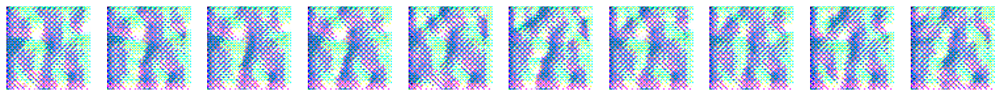

In [ ]:
import os
import warnings
import numpy as np
import matplotlib.pyplot as plt
from keras.optimizers import Adam
from keras.models import Sequential
from keras.layers import Dense, Conv2D, Conv2DTranspose, LeakyReLU
from keras.layers import BatchNormalization, Dropout, Reshape, Flatten
import tensorflow as tf

warnings.filterwarnings('ignore')

# 파일 경로 설정
checkpoint_path = '/content/drive/MyDrive/gan_checkpoint_epoch_03.h5'

# 파일 존재 여부 확인
if os.path.exists(checkpoint_path):
    print("파일이 존재합니다.")
else:
    print("파일이 존재하지 않습니다. 경로를 확인하세요.")

def build_discriminator(image_shape=(64, 64, 3)):
    model = Sequential()
    model.add(Conv2D(128, (3, 3), strides=(2,2), padding="same", input_shape=image_shape))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(128, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(256, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(256, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(512, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Flatten())
    model.add(Dropout(0.4))
    model.add(Dense(1, activation="sigmoid"))
    optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss="binary_crossentropy", optimizer=optimizer, metrics=["accuracy"])
    return model

def build_generator(latent_dim, channels=3):
    model = Sequential()
    model.add(Dense(16 * 16 * 128, input_dim=latent_dim))
    model.add(LeakyReLU(0.2))
    model.add(Reshape((16, 16, 128)))
    model.add(Conv2DTranspose(128, (4, 4), strides=(2, 2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(128, (4, 4), strides=(1, 1), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(64, (4, 4), strides=(2, 2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(64, (4, 4), strides=(1, 1), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(channels, (8, 8), activation='tanh', padding="same"))
    return model

def build_gan(generator, discriminator):
    discriminator.trainable = False
    model = Sequential()
    model.add(generator)
    model.add(discriminator)
    optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss="binary_crossentropy", optimizer=optimizer)
    return model

latent_dim = 100
generator_model = build_generator(latent_dim)
discriminator_model = build_discriminator()
gan_model = build_gan(generator_model, discriminator_model)

# 가중치 로드
if os.path.exists(checkpoint_path):
    print("Checkpoint 파일이 존재합니다.")
    gan_model.load_weights(checkpoint_path)
else:
    print("Checkpoint 파일이 존재하지 않습니다. 경로를 확인하세요.")

# 모델 사용 예시 (노이즈 샘플을 생성하여 이미지를 생성)
def generate_noise_samples(batch_size, latent_dim):
    return np.random.normal(0, 1, (batch_size, latent_dim))

# 노이즈 샘플 생성
noise_samples = generate_noise_samples(10, latent_dim)

# 생성된 이미지
generated_images = generator_model.predict(noise_samples)

# 생성된 이미지 시각화 (예시)
def plot_generated_images(images, n=10):
    plt.figure(figsize=(20, 4))
    for i in range(n):
        plt.subplot(1, n, i + 1)
        plt.imshow((images[i] + 1) / 2)  # 이미지 값을 0-1 범위로 스케일링
        plt.axis('off')
    plt.show()

# 생성된 이미지 플로팅
plot_generated_images(generated_images)


파일이 존재합니다.
Checkpoint 파일이 존재합니다.
1/1 [==============================] - 1s 923ms/step


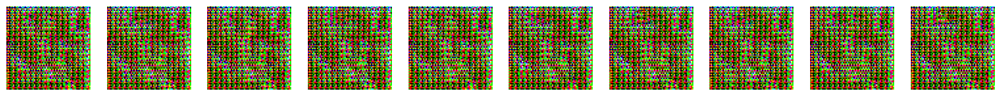

In [ ]:
import os
import warnings
import numpy as np
import matplotlib.pyplot as plt
from keras.optimizers import Adam
from keras.models import Sequential
from keras.layers import Dense, Conv2D, Conv2DTranspose, LeakyReLU
from keras.layers import BatchNormalization, Dropout, Reshape, Flatten
import tensorflow as tf

warnings.filterwarnings('ignore')

# 파일 경로 설정
checkpoint_path = '/content/drive/MyDrive/gan_checkpoint_epoch_04.h5'

# 파일 존재 여부 확인
if os.path.exists(checkpoint_path):
    print("파일이 존재합니다.")
else:
    print("파일이 존재하지 않습니다. 경로를 확인하세요.")

def build_discriminator(image_shape=(64, 64, 3)):
    model = Sequential()
    model.add(Conv2D(128, (3, 3), strides=(2,2), padding="same", input_shape=image_shape))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(128, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(256, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(256, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(512, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Flatten())
    model.add(Dropout(0.4))
    model.add(Dense(1, activation="sigmoid"))
    optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss="binary_crossentropy", optimizer=optimizer, metrics=["accuracy"])
    return model

def build_generator(latent_dim, channels=3):
    model = Sequential()
    model.add(Dense(16 * 16 * 128, input_dim=latent_dim))
    model.add(LeakyReLU(0.2))
    model.add(Reshape((16, 16, 128)))
    model.add(Conv2DTranspose(128, (4, 4), strides=(2, 2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(128, (4, 4), strides=(1, 1), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(64, (4, 4), strides=(2, 2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(64, (4, 4), strides=(1, 1), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(channels, (8, 8), activation='tanh', padding="same"))
    return model

def build_gan(generator, discriminator):
    discriminator.trainable = False
    model = Sequential()
    model.add(generator)
    model.add(discriminator)
    optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss="binary_crossentropy", optimizer=optimizer)
    return model

latent_dim = 100
generator_model = build_generator(latent_dim)
discriminator_model = build_discriminator()
gan_model = build_gan(generator_model, discriminator_model)

# 가중치 로드
if os.path.exists(checkpoint_path):
    print("Checkpoint 파일이 존재합니다.")
    gan_model.load_weights(checkpoint_path)
else:
    print("Checkpoint 파일이 존재하지 않습니다. 경로를 확인하세요.")

# 모델 사용 예시 (노이즈 샘플을 생성하여 이미지를 생성)
def generate_noise_samples(batch_size, latent_dim):
    return np.random.normal(0, 1, (batch_size, latent_dim))

# 노이즈 샘플 생성
noise_samples = generate_noise_samples(10, latent_dim)

# 생성된 이미지
generated_images = generator_model.predict(noise_samples)

# 생성된 이미지 시각화 (예시)
def plot_generated_images(images, n=10):
    plt.figure(figsize=(20, 4))
    for i in range(n):
        plt.subplot(1, n, i + 1)
        plt.imshow((images[i] + 1) / 2)  # 이미지 값을 0-1 범위로 스케일링
        plt.axis('off')
    plt.show()

# 생성된 이미지 플로팅
plot_generated_images(generated_images)


파일이 존재합니다.
Checkpoint 파일이 존재합니다.
1/1 [==============================] - 1s 951ms/step


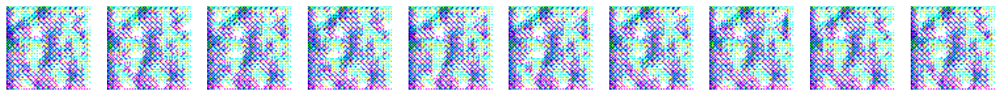

In [ ]:
import os
import warnings
import numpy as np
import matplotlib.pyplot as plt
from keras.optimizers import Adam
from keras.models import Sequential
from keras.layers import Dense, Conv2D, Conv2DTranspose, LeakyReLU
from keras.layers import BatchNormalization, Dropout, Reshape, Flatten
import tensorflow as tf

warnings.filterwarnings('ignore')

# 파일 경로 설정
checkpoint_path = '/content/drive/MyDrive/gan_checkpoint_epoch_05.h5'

# 파일 존재 여부 확인
if os.path.exists(checkpoint_path):
    print("파일이 존재합니다.")
else:
    print("파일이 존재하지 않습니다. 경로를 확인하세요.")

def build_discriminator(image_shape=(64, 64, 3)):
    model = Sequential()
    model.add(Conv2D(128, (3, 3), strides=(2,2), padding="same", input_shape=image_shape))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(128, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(256, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(256, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(512, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Flatten())
    model.add(Dropout(0.4))
    model.add(Dense(1, activation="sigmoid"))
    optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss="binary_crossentropy", optimizer=optimizer, metrics=["accuracy"])
    return model

def build_generator(latent_dim, channels=3):
    model = Sequential()
    model.add(Dense(16 * 16 * 128, input_dim=latent_dim))
    model.add(LeakyReLU(0.2))
    model.add(Reshape((16, 16, 128)))
    model.add(Conv2DTranspose(128, (4, 4), strides=(2, 2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(128, (4, 4), strides=(1, 1), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(64, (4, 4), strides=(2, 2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(64, (4, 4), strides=(1, 1), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(channels, (8, 8), activation='tanh', padding="same"))
    return model

def build_gan(generator, discriminator):
    discriminator.trainable = False
    model = Sequential()
    model.add(generator)
    model.add(discriminator)
    optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss="binary_crossentropy", optimizer=optimizer)
    return model

latent_dim = 100
generator_model = build_generator(latent_dim)
discriminator_model = build_discriminator()
gan_model = build_gan(generator_model, discriminator_model)

# 가중치 로드
if os.path.exists(checkpoint_path):
    print("Checkpoint 파일이 존재합니다.")
    gan_model.load_weights(checkpoint_path)
else:
    print("Checkpoint 파일이 존재하지 않습니다. 경로를 확인하세요.")

# 모델 사용 예시 (노이즈 샘플을 생성하여 이미지를 생성)
def generate_noise_samples(batch_size, latent_dim):
    return np.random.normal(0, 1, (batch_size, latent_dim))

# 노이즈 샘플 생성
noise_samples = generate_noise_samples(10, latent_dim)

# 생성된 이미지
generated_images = generator_model.predict(noise_samples)

# 생성된 이미지 시각화 (예시)
def plot_generated_images(images, n=10):
    plt.figure(figsize=(20, 4))
    for i in range(n):
        plt.subplot(1, n, i + 1)
        plt.imshow((images[i] + 1) / 2)  # 이미지 값을 0-1 범위로 스케일링
        plt.axis('off')
    plt.show()

# 생성된 이미지 플로팅
plot_generated_images(generated_images)


파일이 존재합니다.
Checkpoint 파일이 존재합니다.
1/1 [==============================] - 1s 606ms/step


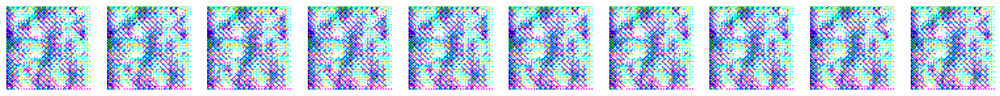

In [ ]:
import os
import warnings
import numpy as np
import matplotlib.pyplot as plt
from keras.optimizers import Adam
from keras.models import Sequential
from keras.layers import Dense, Conv2D, Conv2DTranspose, LeakyReLU
from keras.layers import BatchNormalization, Dropout, Reshape, Flatten
import tensorflow as tf

warnings.filterwarnings('ignore')

# 파일 경로 설정
checkpoint_path = '/content/drive/MyDrive/gan_checkpoint_epoch_06.h5'

# 파일 존재 여부 확인
if os.path.exists(checkpoint_path):
    print("파일이 존재합니다.")
else:
    print("파일이 존재하지 않습니다. 경로를 확인하세요.")

def build_discriminator(image_shape=(64, 64, 3)):
    model = Sequential()
    model.add(Conv2D(128, (3, 3), strides=(2,2), padding="same", input_shape=image_shape))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(128, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(256, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(256, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(512, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Flatten())
    model.add(Dropout(0.4))
    model.add(Dense(1, activation="sigmoid"))
    optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss="binary_crossentropy", optimizer=optimizer, metrics=["accuracy"])
    return model

def build_generator(latent_dim, channels=3):
    model = Sequential()
    model.add(Dense(16 * 16 * 128, input_dim=latent_dim))
    model.add(LeakyReLU(0.2))
    model.add(Reshape((16, 16, 128)))
    model.add(Conv2DTranspose(128, (4, 4), strides=(2, 2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(128, (4, 4), strides=(1, 1), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(64, (4, 4), strides=(2, 2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(64, (4, 4), strides=(1, 1), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(channels, (8, 8), activation='tanh', padding="same"))
    return model

def build_gan(generator, discriminator):
    discriminator.trainable = False
    model = Sequential()
    model.add(generator)
    model.add(discriminator)
    optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss="binary_crossentropy", optimizer=optimizer)
    return model

latent_dim = 100
generator_model = build_generator(latent_dim)
discriminator_model = build_discriminator()
gan_model = build_gan(generator_model, discriminator_model)

# 가중치 로드
if os.path.exists(checkpoint_path):
    print("Checkpoint 파일이 존재합니다.")
    gan_model.load_weights(checkpoint_path)
else:
    print("Checkpoint 파일이 존재하지 않습니다. 경로를 확인하세요.")

# 모델 사용 예시 (노이즈 샘플을 생성하여 이미지를 생성)
def generate_noise_samples(batch_size, latent_dim):
    return np.random.normal(0, 1, (batch_size, latent_dim))

# 노이즈 샘플 생성
noise_samples = generate_noise_samples(10, latent_dim)

# 생성된 이미지
generated_images = generator_model.predict(noise_samples)

# 생성된 이미지 시각화 (예시)
def plot_generated_images(images, n=10):
    plt.figure(figsize=(20, 4))
    for i in range(n):
        plt.subplot(1, n, i + 1)
        plt.imshow((images[i] + 1) / 2)  # 이미지 값을 0-1 범위로 스케일링
        plt.axis('off')
    plt.show()

# 생성된 이미지 플로팅
plot_generated_images(generated_images)


파일이 존재합니다.
Checkpoint 파일이 존재합니다.
1/1 [==============================] - 1s 589ms/step


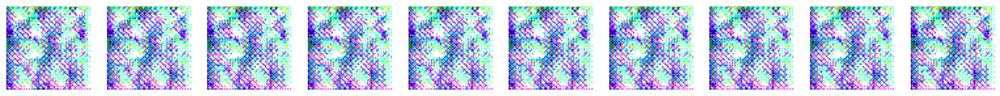

In [ ]:
import os
import warnings
import numpy as np
import matplotlib.pyplot as plt
from keras.optimizers import Adam
from keras.models import Sequential
from keras.layers import Dense, Conv2D, Conv2DTranspose, LeakyReLU
from keras.layers import BatchNormalization, Dropout, Reshape, Flatten
import tensorflow as tf

warnings.filterwarnings('ignore')

# 파일 경로 설정
checkpoint_path = '/content/drive/MyDrive/gan_checkpoint_epoch_07.h5'

# 파일 존재 여부 확인
if os.path.exists(checkpoint_path):
    print("파일이 존재합니다.")
else:
    print("파일이 존재하지 않습니다. 경로를 확인하세요.")

def build_discriminator(image_shape=(64, 64, 3)):
    model = Sequential()
    model.add(Conv2D(128, (3, 3), strides=(2,2), padding="same", input_shape=image_shape))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(128, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(256, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(256, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(512, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Flatten())
    model.add(Dropout(0.4))
    model.add(Dense(1, activation="sigmoid"))
    optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss="binary_crossentropy", optimizer=optimizer, metrics=["accuracy"])
    return model

def build_generator(latent_dim, channels=3):
    model = Sequential()
    model.add(Dense(16 * 16 * 128, input_dim=latent_dim))
    model.add(LeakyReLU(0.2))
    model.add(Reshape((16, 16, 128)))
    model.add(Conv2DTranspose(128, (4, 4), strides=(2, 2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(128, (4, 4), strides=(1, 1), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(64, (4, 4), strides=(2, 2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(64, (4, 4), strides=(1, 1), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(channels, (8, 8), activation='tanh', padding="same"))
    return model

def build_gan(generator, discriminator):
    discriminator.trainable = False
    model = Sequential()
    model.add(generator)
    model.add(discriminator)
    optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss="binary_crossentropy", optimizer=optimizer)
    return model

latent_dim = 100
generator_model = build_generator(latent_dim)
discriminator_model = build_discriminator()
gan_model = build_gan(generator_model, discriminator_model)

# 가중치 로드
if os.path.exists(checkpoint_path):
    print("Checkpoint 파일이 존재합니다.")
    gan_model.load_weights(checkpoint_path)
else:
    print("Checkpoint 파일이 존재하지 않습니다. 경로를 확인하세요.")

# 모델 사용 예시 (노이즈 샘플을 생성하여 이미지를 생성)
def generate_noise_samples(batch_size, latent_dim):
    return np.random.normal(0, 1, (batch_size, latent_dim))

# 노이즈 샘플 생성
noise_samples = generate_noise_samples(10, latent_dim)

# 생성된 이미지
generated_images = generator_model.predict(noise_samples)

# 생성된 이미지 시각화 (예시)
def plot_generated_images(images, n=10):
    plt.figure(figsize=(20, 4))
    for i in range(n):
        plt.subplot(1, n, i + 1)
        plt.imshow((images[i] + 1) / 2)  # 이미지 값을 0-1 범위로 스케일링
        plt.axis('off')
    plt.show()

# 생성된 이미지 플로팅
plot_generated_images(generated_images)


파일이 존재합니다.
Checkpoint 파일이 존재합니다.
1/1 [==============================] - 1s 811ms/step


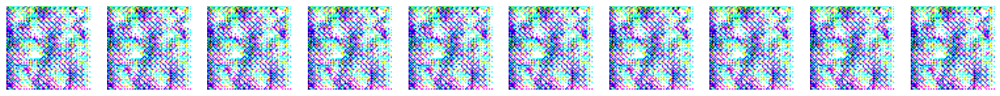

In [ ]:
import os
import warnings
import numpy as np
import matplotlib.pyplot as plt
from keras.optimizers import Adam
from keras.models import Sequential
from keras.layers import Dense, Conv2D, Conv2DTranspose, LeakyReLU
from keras.layers import BatchNormalization, Dropout, Reshape, Flatten
import tensorflow as tf

warnings.filterwarnings('ignore')

# 파일 경로 설정
checkpoint_path = '/content/drive/MyDrive/gan_checkpoint_epoch_08.h5'

# 파일 존재 여부 확인
if os.path.exists(checkpoint_path):
    print("파일이 존재합니다.")
else:
    print("파일이 존재하지 않습니다. 경로를 확인하세요.")

def build_discriminator(image_shape=(64, 64, 3)):
    model = Sequential()
    model.add(Conv2D(128, (3, 3), strides=(2,2), padding="same", input_shape=image_shape))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(128, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(256, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(256, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(512, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Flatten())
    model.add(Dropout(0.4))
    model.add(Dense(1, activation="sigmoid"))
    optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss="binary_crossentropy", optimizer=optimizer, metrics=["accuracy"])
    return model

def build_generator(latent_dim, channels=3):
    model = Sequential()
    model.add(Dense(16 * 16 * 128, input_dim=latent_dim))
    model.add(LeakyReLU(0.2))
    model.add(Reshape((16, 16, 128)))
    model.add(Conv2DTranspose(128, (4, 4), strides=(2, 2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(128, (4, 4), strides=(1, 1), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(64, (4, 4), strides=(2, 2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(64, (4, 4), strides=(1, 1), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(channels, (8, 8), activation='tanh', padding="same"))
    return model

def build_gan(generator, discriminator):
    discriminator.trainable = False
    model = Sequential()
    model.add(generator)
    model.add(discriminator)
    optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss="binary_crossentropy", optimizer=optimizer)
    return model

latent_dim = 100
generator_model = build_generator(latent_dim)
discriminator_model = build_discriminator()
gan_model = build_gan(generator_model, discriminator_model)

# 가중치 로드
if os.path.exists(checkpoint_path):
    print("Checkpoint 파일이 존재합니다.")
    gan_model.load_weights(checkpoint_path)
else:
    print("Checkpoint 파일이 존재하지 않습니다. 경로를 확인하세요.")

# 모델 사용 예시 (노이즈 샘플을 생성하여 이미지를 생성)
def generate_noise_samples(batch_size, latent_dim):
    return np.random.normal(0, 1, (batch_size, latent_dim))

# 노이즈 샘플 생성
noise_samples = generate_noise_samples(10, latent_dim)

# 생성된 이미지
generated_images = generator_model.predict(noise_samples)

# 생성된 이미지 시각화 (예시)
def plot_generated_images(images, n=10):
    plt.figure(figsize=(20, 4))
    for i in range(n):
        plt.subplot(1, n, i + 1)
        plt.imshow((images[i] + 1) / 2)  # 이미지 값을 0-1 범위로 스케일링
        plt.axis('off')
    plt.show()

# 생성된 이미지 플로팅
plot_generated_images(generated_images)


파일이 존재합니다.
Checkpoint 파일이 존재합니다.
1/1 [==============================] - 1s 743ms/step


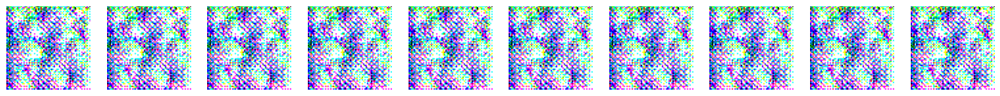

In [ ]:
import os
import warnings
import numpy as np
import matplotlib.pyplot as plt
from keras.optimizers import Adam
from keras.models import Sequential
from keras.layers import Dense, Conv2D, Conv2DTranspose, LeakyReLU
from keras.layers import BatchNormalization, Dropout, Reshape, Flatten
import tensorflow as tf

warnings.filterwarnings('ignore')

# 파일 경로 설정
checkpoint_path = '/content/drive/MyDrive/gan_checkpoint_epoch_10.h5'

# 파일 존재 여부 확인
if os.path.exists(checkpoint_path):
    print("파일이 존재합니다.")
else:
    print("파일이 존재하지 않습니다. 경로를 확인하세요.")

def build_discriminator(image_shape=(64, 64, 3)):
    model = Sequential()
    model.add(Conv2D(128, (3, 3), strides=(2,2), padding="same", input_shape=image_shape))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(128, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(256, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(256, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(512, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Flatten())
    model.add(Dropout(0.4))
    model.add(Dense(1, activation="sigmoid"))
    optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss="binary_crossentropy", optimizer=optimizer, metrics=["accuracy"])
    return model

def build_generator(latent_dim, channels=3):
    model = Sequential()
    model.add(Dense(16 * 16 * 128, input_dim=latent_dim))
    model.add(LeakyReLU(0.2))
    model.add(Reshape((16, 16, 128)))
    model.add(Conv2DTranspose(128, (4, 4), strides=(2, 2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(128, (4, 4), strides=(1, 1), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(64, (4, 4), strides=(2, 2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(64, (4, 4), strides=(1, 1), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(channels, (8, 8), activation='tanh', padding="same"))
    return model

def build_gan(generator, discriminator):
    discriminator.trainable = False
    model = Sequential()
    model.add(generator)
    model.add(discriminator)
    optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss="binary_crossentropy", optimizer=optimizer)
    return model

latent_dim = 100
generator_model = build_generator(latent_dim)
discriminator_model = build_discriminator()
gan_model = build_gan(generator_model, discriminator_model)

# 가중치 로드
if os.path.exists(checkpoint_path):
    print("Checkpoint 파일이 존재합니다.")
    gan_model.load_weights(checkpoint_path)
else:
    print("Checkpoint 파일이 존재하지 않습니다. 경로를 확인하세요.")

# 모델 사용 예시 (노이즈 샘플을 생성하여 이미지를 생성)
def generate_noise_samples(batch_size, latent_dim):
    return np.random.normal(0, 1, (batch_size, latent_dim))

# 노이즈 샘플 생성
noise_samples = generate_noise_samples(10, latent_dim)

# 생성된 이미지
generated_images = generator_model.predict(noise_samples)

# 생성된 이미지 시각화 (예시)
def plot_generated_images(images, n=10):
    plt.figure(figsize=(20, 4))
    for i in range(n):
        plt.subplot(1, n, i + 1)
        plt.imshow((images[i] + 1) / 2)  # 이미지 값을 0-1 범위로 스케일링
        plt.axis('off')
    plt.show()

# 생성된 이미지 플로팅
plot_generated_images(generated_images)


파일이 존재합니다.
Checkpoint 파일이 존재합니다.
1/1 [==============================] - 1s 1s/step


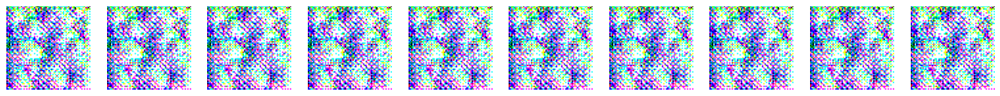

In [ ]:
import os
import warnings
import numpy as np
import matplotlib.pyplot as plt
from keras.optimizers import Adam
from keras.models import Sequential
from keras.layers import Dense, Conv2D, Conv2DTranspose, LeakyReLU
from keras.layers import BatchNormalization, Dropout, Reshape, Flatten
import tensorflow as tf

warnings.filterwarnings('ignore')

# 파일 경로 설정
checkpoint_path = '/content/drive/MyDrive/gan_checkpoint_epoch_11.h5'

# 파일 존재 여부 확인
if os.path.exists(checkpoint_path):
    print("파일이 존재합니다.")
else:
    print("파일이 존재하지 않습니다. 경로를 확인하세요.")

def build_discriminator(image_shape=(64, 64, 3)):
    model = Sequential()
    model.add(Conv2D(128, (3, 3), strides=(2,2), padding="same", input_shape=image_shape))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(128, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(256, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(256, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(512, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Flatten())
    model.add(Dropout(0.4))
    model.add(Dense(1, activation="sigmoid"))
    optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss="binary_crossentropy", optimizer=optimizer, metrics=["accuracy"])
    return model

def build_generator(latent_dim, channels=3):
    model = Sequential()
    model.add(Dense(16 * 16 * 128, input_dim=latent_dim))
    model.add(LeakyReLU(0.2))
    model.add(Reshape((16, 16, 128)))
    model.add(Conv2DTranspose(128, (4, 4), strides=(2, 2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(128, (4, 4), strides=(1, 1), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(64, (4, 4), strides=(2, 2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(64, (4, 4), strides=(1, 1), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(channels, (8, 8), activation='tanh', padding="same"))
    return model

def build_gan(generator, discriminator):
    discriminator.trainable = False
    model = Sequential()
    model.add(generator)
    model.add(discriminator)
    optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss="binary_crossentropy", optimizer=optimizer)
    return model

latent_dim = 100
generator_model = build_generator(latent_dim)
discriminator_model = build_discriminator()
gan_model = build_gan(generator_model, discriminator_model)

# 가중치 로드
if os.path.exists(checkpoint_path):
    print("Checkpoint 파일이 존재합니다.")
    gan_model.load_weights(checkpoint_path)
else:
    print("Checkpoint 파일이 존재하지 않습니다. 경로를 확인하세요.")

# 모델 사용 예시 (노이즈 샘플을 생성하여 이미지를 생성)
def generate_noise_samples(batch_size, latent_dim):
    return np.random.normal(0, 1, (batch_size, latent_dim))

# 노이즈 샘플 생성
noise_samples = generate_noise_samples(10, latent_dim)

# 생성된 이미지
generated_images = generator_model.predict(noise_samples)

# 생성된 이미지 시각화 (예시)
def plot_generated_images(images, n=10):
    plt.figure(figsize=(20, 4))
    for i in range(n):
        plt.subplot(1, n, i + 1)
        plt.imshow((images[i] + 1) / 2)  # 이미지 값을 0-1 범위로 스케일링
        plt.axis('off')
    plt.show()

# 생성된 이미지 플로팅
plot_generated_images(generated_images)


파일이 존재합니다.
Checkpoint 파일이 존재합니다.
1/1 [==============================] - 1s 641ms/step


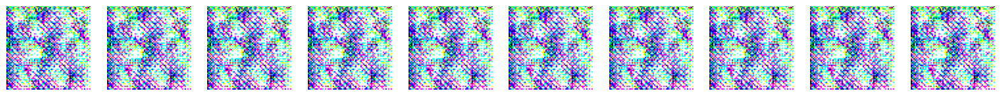

In [ ]:
import os
import warnings
import numpy as np
import matplotlib.pyplot as plt
from keras.optimizers import Adam
from keras.models import Sequential
from keras.layers import Dense, Conv2D, Conv2DTranspose, LeakyReLU
from keras.layers import BatchNormalization, Dropout, Reshape, Flatten
import tensorflow as tf

warnings.filterwarnings('ignore')

# 파일 경로 설정
checkpoint_path = '/content/drive/MyDrive/gan_checkpoint_epoch_12.h5'

# 파일 존재 여부 확인
if os.path.exists(checkpoint_path):
    print("파일이 존재합니다.")
else:
    print("파일이 존재하지 않습니다. 경로를 확인하세요.")

def build_discriminator(image_shape=(64, 64, 3)):
    model = Sequential()
    model.add(Conv2D(128, (3, 3), strides=(2,2), padding="same", input_shape=image_shape))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(128, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(256, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(256, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(512, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Flatten())
    model.add(Dropout(0.4))
    model.add(Dense(1, activation="sigmoid"))
    optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss="binary_crossentropy", optimizer=optimizer, metrics=["accuracy"])
    return model

def build_generator(latent_dim, channels=3):
    model = Sequential()
    model.add(Dense(16 * 16 * 128, input_dim=latent_dim))
    model.add(LeakyReLU(0.2))
    model.add(Reshape((16, 16, 128)))
    model.add(Conv2DTranspose(128, (4, 4), strides=(2, 2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(128, (4, 4), strides=(1, 1), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(64, (4, 4), strides=(2, 2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(64, (4, 4), strides=(1, 1), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(channels, (8, 8), activation='tanh', padding="same"))
    return model

def build_gan(generator, discriminator):
    discriminator.trainable = False
    model = Sequential()
    model.add(generator)
    model.add(discriminator)
    optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss="binary_crossentropy", optimizer=optimizer)
    return model

latent_dim = 100
generator_model = build_generator(latent_dim)
discriminator_model = build_discriminator()
gan_model = build_gan(generator_model, discriminator_model)

# 가중치 로드
if os.path.exists(checkpoint_path):
    print("Checkpoint 파일이 존재합니다.")
    gan_model.load_weights(checkpoint_path)
else:
    print("Checkpoint 파일이 존재하지 않습니다. 경로를 확인하세요.")

# 모델 사용 예시 (노이즈 샘플을 생성하여 이미지를 생성)
def generate_noise_samples(batch_size, latent_dim):
    return np.random.normal(0, 1, (batch_size, latent_dim))

# 노이즈 샘플 생성
noise_samples = generate_noise_samples(10, latent_dim)

# 생성된 이미지
generated_images = generator_model.predict(noise_samples)

# 생성된 이미지 시각화 (예시)
def plot_generated_images(images, n=10):
    plt.figure(figsize=(20, 4))
    for i in range(n):
        plt.subplot(1, n, i + 1)
        plt.imshow((images[i] + 1) / 2)  # 이미지 값을 0-1 범위로 스케일링
        plt.axis('off')
    plt.show()

# 생성된 이미지 플로팅
plot_generated_images(generated_images)


파일이 존재합니다.
Checkpoint 파일이 존재합니다.
1/1 [==============================] - 1s 558ms/step


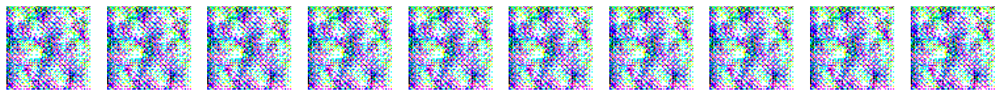

In [ ]:
import os
import warnings
import numpy as np
import matplotlib.pyplot as plt
from keras.optimizers import Adam
from keras.models import Sequential
from keras.layers import Dense, Conv2D, Conv2DTranspose, LeakyReLU
from keras.layers import BatchNormalization, Dropout, Reshape, Flatten
import tensorflow as tf

warnings.filterwarnings('ignore')

# 파일 경로 설정
checkpoint_path = '/content/drive/MyDrive/gan_checkpoint_epoch_13.h5'

# 파일 존재 여부 확인
if os.path.exists(checkpoint_path):
    print("파일이 존재합니다.")
else:
    print("파일이 존재하지 않습니다. 경로를 확인하세요.")

def build_discriminator(image_shape=(64, 64, 3)):
    model = Sequential()
    model.add(Conv2D(128, (3, 3), strides=(2,2), padding="same", input_shape=image_shape))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(128, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(256, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(256, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(512, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Flatten())
    model.add(Dropout(0.4))
    model.add(Dense(1, activation="sigmoid"))
    optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss="binary_crossentropy", optimizer=optimizer, metrics=["accuracy"])
    return model

def build_generator(latent_dim, channels=3):
    model = Sequential()
    model.add(Dense(16 * 16 * 128, input_dim=latent_dim))
    model.add(LeakyReLU(0.2))
    model.add(Reshape((16, 16, 128)))
    model.add(Conv2DTranspose(128, (4, 4), strides=(2, 2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(128, (4, 4), strides=(1, 1), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(64, (4, 4), strides=(2, 2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(64, (4, 4), strides=(1, 1), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(channels, (8, 8), activation='tanh', padding="same"))
    return model

def build_gan(generator, discriminator):
    discriminator.trainable = False
    model = Sequential()
    model.add(generator)
    model.add(discriminator)
    optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss="binary_crossentropy", optimizer=optimizer)
    return model

latent_dim = 100
generator_model = build_generator(latent_dim)
discriminator_model = build_discriminator()
gan_model = build_gan(generator_model, discriminator_model)

# 가중치 로드
if os.path.exists(checkpoint_path):
    print("Checkpoint 파일이 존재합니다.")
    gan_model.load_weights(checkpoint_path)
else:
    print("Checkpoint 파일이 존재하지 않습니다. 경로를 확인하세요.")

# 모델 사용 예시 (노이즈 샘플을 생성하여 이미지를 생성)
def generate_noise_samples(batch_size, latent_dim):
    return np.random.normal(0, 1, (batch_size, latent_dim))

# 노이즈 샘플 생성
noise_samples = generate_noise_samples(10, latent_dim)

# 생성된 이미지
generated_images = generator_model.predict(noise_samples)

# 생성된 이미지 시각화 (예시)
def plot_generated_images(images, n=10):
    plt.figure(figsize=(20, 4))
    for i in range(n):
        plt.subplot(1, n, i + 1)
        plt.imshow((images[i] + 1) / 2)  # 이미지 값을 0-1 범위로 스케일링
        plt.axis('off')
    plt.show()

# 생성된 이미지 플로팅
plot_generated_images(generated_images)


파일이 존재합니다.
Checkpoint 파일이 존재합니다.
1/1 [==============================] - 1s 1s/step


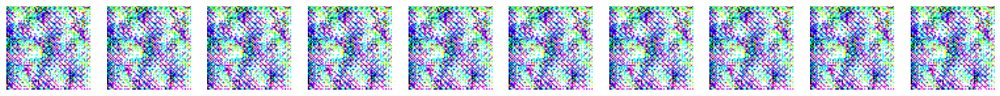

In [ ]:
import os
import warnings
import numpy as np
import matplotlib.pyplot as plt
from keras.optimizers import Adam
from keras.models import Sequential
from keras.layers import Dense, Conv2D, Conv2DTranspose, LeakyReLU
from keras.layers import BatchNormalization, Dropout, Reshape, Flatten
import tensorflow as tf

warnings.filterwarnings('ignore')

# 파일 경로 설정
checkpoint_path = '/content/drive/MyDrive/gan_checkpoint_epoch_14.h5'

# 파일 존재 여부 확인
if os.path.exists(checkpoint_path):
    print("파일이 존재합니다.")
else:
    print("파일이 존재하지 않습니다. 경로를 확인하세요.")

def build_discriminator(image_shape=(64, 64, 3)):
    model = Sequential()
    model.add(Conv2D(128, (3, 3), strides=(2,2), padding="same", input_shape=image_shape))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(128, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(256, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(256, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(512, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Flatten())
    model.add(Dropout(0.4))
    model.add(Dense(1, activation="sigmoid"))
    optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss="binary_crossentropy", optimizer=optimizer, metrics=["accuracy"])
    return model

def build_generator(latent_dim, channels=3):
    model = Sequential()
    model.add(Dense(16 * 16 * 128, input_dim=latent_dim))
    model.add(LeakyReLU(0.2))
    model.add(Reshape((16, 16, 128)))
    model.add(Conv2DTranspose(128, (4, 4), strides=(2, 2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(128, (4, 4), strides=(1, 1), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(64, (4, 4), strides=(2, 2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(64, (4, 4), strides=(1, 1), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(channels, (8, 8), activation='tanh', padding="same"))
    return model

def build_gan(generator, discriminator):
    discriminator.trainable = False
    model = Sequential()
    model.add(generator)
    model.add(discriminator)
    optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss="binary_crossentropy", optimizer=optimizer)
    return model

latent_dim = 100
generator_model = build_generator(latent_dim)
discriminator_model = build_discriminator()
gan_model = build_gan(generator_model, discriminator_model)

# 가중치 로드
if os.path.exists(checkpoint_path):
    print("Checkpoint 파일이 존재합니다.")
    gan_model.load_weights(checkpoint_path)
else:
    print("Checkpoint 파일이 존재하지 않습니다. 경로를 확인하세요.")

# 모델 사용 예시 (노이즈 샘플을 생성하여 이미지를 생성)
def generate_noise_samples(batch_size, latent_dim):
    return np.random.normal(0, 1, (batch_size, latent_dim))

# 노이즈 샘플 생성
noise_samples = generate_noise_samples(10, latent_dim)

# 생성된 이미지
generated_images = generator_model.predict(noise_samples)

# 생성된 이미지 시각화 (예시)
def plot_generated_images(images, n=10):
    plt.figure(figsize=(20, 4))
    for i in range(n):
        plt.subplot(1, n, i + 1)
        plt.imshow((images[i] + 1) / 2)  # 이미지 값을 0-1 범위로 스케일링
        plt.axis('off')
    plt.show()

# 생성된 이미지 플로팅
plot_generated_images(generated_images)


파일이 존재합니다.
Checkpoint 파일이 존재합니다.
1/1 [==============================] - 1s 1s/step


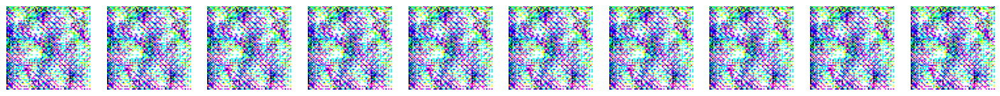

In [ ]:
import os
import warnings
import numpy as np
import matplotlib.pyplot as plt
from keras.optimizers import Adam
from keras.models import Sequential
from keras.layers import Dense, Conv2D, Conv2DTranspose, LeakyReLU
from keras.layers import BatchNormalization, Dropout, Reshape, Flatten
import tensorflow as tf

warnings.filterwarnings('ignore')

# 파일 경로 설정
checkpoint_path = '/content/drive/MyDrive/gan_checkpoint_epoch_15.h5'

# 파일 존재 여부 확인
if os.path.exists(checkpoint_path):
    print("파일이 존재합니다.")
else:
    print("파일이 존재하지 않습니다. 경로를 확인하세요.")

def build_discriminator(image_shape=(64, 64, 3)):
    model = Sequential()
    model.add(Conv2D(128, (3, 3), strides=(2,2), padding="same", input_shape=image_shape))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(128, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(256, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(256, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(512, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Flatten())
    model.add(Dropout(0.4))
    model.add(Dense(1, activation="sigmoid"))
    optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss="binary_crossentropy", optimizer=optimizer, metrics=["accuracy"])
    return model

def build_generator(latent_dim, channels=3):
    model = Sequential()
    model.add(Dense(16 * 16 * 128, input_dim=latent_dim))
    model.add(LeakyReLU(0.2))
    model.add(Reshape((16, 16, 128)))
    model.add(Conv2DTranspose(128, (4, 4), strides=(2, 2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(128, (4, 4), strides=(1, 1), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(64, (4, 4), strides=(2, 2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(64, (4, 4), strides=(1, 1), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(channels, (8, 8), activation='tanh', padding="same"))
    return model

def build_gan(generator, discriminator):
    discriminator.trainable = False
    model = Sequential()
    model.add(generator)
    model.add(discriminator)
    optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss="binary_crossentropy", optimizer=optimizer)
    return model

latent_dim = 100
generator_model = build_generator(latent_dim)
discriminator_model = build_discriminator()
gan_model = build_gan(generator_model, discriminator_model)

# 가중치 로드
if os.path.exists(checkpoint_path):
    print("Checkpoint 파일이 존재합니다.")
    gan_model.load_weights(checkpoint_path)
else:
    print("Checkpoint 파일이 존재하지 않습니다. 경로를 확인하세요.")

# 모델 사용 예시 (노이즈 샘플을 생성하여 이미지를 생성)
def generate_noise_samples(batch_size, latent_dim):
    return np.random.normal(0, 1, (batch_size, latent_dim))

# 노이즈 샘플 생성
noise_samples = generate_noise_samples(10, latent_dim)

# 생성된 이미지
generated_images = generator_model.predict(noise_samples)

# 생성된 이미지 시각화 (예시)
def plot_generated_images(images, n=10):
    plt.figure(figsize=(20, 4))
    for i in range(n):
        plt.subplot(1, n, i + 1)
        plt.imshow((images[i] + 1) / 2)  # 이미지 값을 0-1 범위로 스케일링
        plt.axis('off')
    plt.show()

# 생성된 이미지 플로팅
plot_generated_images(generated_images)


파일이 존재합니다.
Checkpoint 파일이 존재합니다.
1/1 [==============================] - 1s 594ms/step


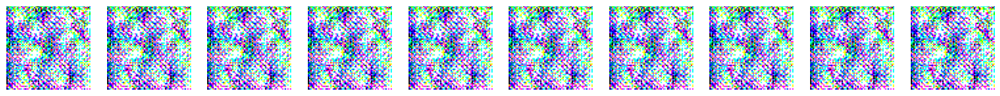

In [ ]:
import os
import warnings
import numpy as np
import matplotlib.pyplot as plt
from keras.optimizers import Adam
from keras.models import Sequential
from keras.layers import Dense, Conv2D, Conv2DTranspose, LeakyReLU
from keras.layers import BatchNormalization, Dropout, Reshape, Flatten
import tensorflow as tf

warnings.filterwarnings('ignore')

# 파일 경로 설정
checkpoint_path = '/content/drive/MyDrive/gan_checkpoint_epoch_16.h5'

# 파일 존재 여부 확인
if os.path.exists(checkpoint_path):
    print("파일이 존재합니다.")
else:
    print("파일이 존재하지 않습니다. 경로를 확인하세요.")

def build_discriminator(image_shape=(64, 64, 3)):
    model = Sequential()
    model.add(Conv2D(128, (3, 3), strides=(2,2), padding="same", input_shape=image_shape))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(128, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(256, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(256, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(512, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Flatten())
    model.add(Dropout(0.4))
    model.add(Dense(1, activation="sigmoid"))
    optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss="binary_crossentropy", optimizer=optimizer, metrics=["accuracy"])
    return model

def build_generator(latent_dim, channels=3):
    model = Sequential()
    model.add(Dense(16 * 16 * 128, input_dim=latent_dim))
    model.add(LeakyReLU(0.2))
    model.add(Reshape((16, 16, 128)))
    model.add(Conv2DTranspose(128, (4, 4), strides=(2, 2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(128, (4, 4), strides=(1, 1), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(64, (4, 4), strides=(2, 2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(64, (4, 4), strides=(1, 1), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(channels, (8, 8), activation='tanh', padding="same"))
    return model

def build_gan(generator, discriminator):
    discriminator.trainable = False
    model = Sequential()
    model.add(generator)
    model.add(discriminator)
    optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss="binary_crossentropy", optimizer=optimizer)
    return model

latent_dim = 100
generator_model = build_generator(latent_dim)
discriminator_model = build_discriminator()
gan_model = build_gan(generator_model, discriminator_model)

# 가중치 로드
if os.path.exists(checkpoint_path):
    print("Checkpoint 파일이 존재합니다.")
    gan_model.load_weights(checkpoint_path)
else:
    print("Checkpoint 파일이 존재하지 않습니다. 경로를 확인하세요.")

# 모델 사용 예시 (노이즈 샘플을 생성하여 이미지를 생성)
def generate_noise_samples(batch_size, latent_dim):
    return np.random.normal(0, 1, (batch_size, latent_dim))

# 노이즈 샘플 생성
noise_samples = generate_noise_samples(10, latent_dim)

# 생성된 이미지
generated_images = generator_model.predict(noise_samples)

# 생성된 이미지 시각화 (예시)
def plot_generated_images(images, n=10):
    plt.figure(figsize=(20, 4))
    for i in range(n):
        plt.subplot(1, n, i + 1)
        plt.imshow((images[i] + 1) / 2)  # 이미지 값을 0-1 범위로 스케일링
        plt.axis('off')
    plt.show()

# 생성된 이미지 플로팅
plot_generated_images(generated_images)


파일이 존재합니다.
Checkpoint 파일이 존재합니다.
1/1 [==============================] - 1s 628ms/step


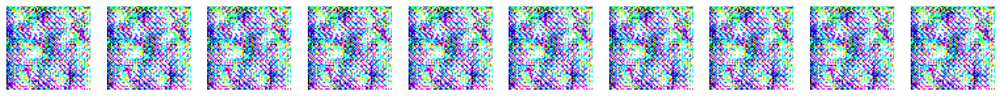

In [ ]:
import os
import warnings
import numpy as np
import matplotlib.pyplot as plt
from keras.optimizers import Adam
from keras.models import Sequential
from keras.layers import Dense, Conv2D, Conv2DTranspose, LeakyReLU
from keras.layers import BatchNormalization, Dropout, Reshape, Flatten
import tensorflow as tf

warnings.filterwarnings('ignore')

# 파일 경로 설정
checkpoint_path = '/content/drive/MyDrive/gan_checkpoint_epoch_17.h5'

# 파일 존재 여부 확인
if os.path.exists(checkpoint_path):
    print("파일이 존재합니다.")
else:
    print("파일이 존재하지 않습니다. 경로를 확인하세요.")

def build_discriminator(image_shape=(64, 64, 3)):
    model = Sequential()
    model.add(Conv2D(128, (3, 3), strides=(2,2), padding="same", input_shape=image_shape))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(128, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(256, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(256, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(512, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Flatten())
    model.add(Dropout(0.4))
    model.add(Dense(1, activation="sigmoid"))
    optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss="binary_crossentropy", optimizer=optimizer, metrics=["accuracy"])
    return model

def build_generator(latent_dim, channels=3):
    model = Sequential()
    model.add(Dense(16 * 16 * 128, input_dim=latent_dim))
    model.add(LeakyReLU(0.2))
    model.add(Reshape((16, 16, 128)))
    model.add(Conv2DTranspose(128, (4, 4), strides=(2, 2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(128, (4, 4), strides=(1, 1), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(64, (4, 4), strides=(2, 2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(64, (4, 4), strides=(1, 1), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(channels, (8, 8), activation='tanh', padding="same"))
    return model

def build_gan(generator, discriminator):
    discriminator.trainable = False
    model = Sequential()
    model.add(generator)
    model.add(discriminator)
    optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss="binary_crossentropy", optimizer=optimizer)
    return model

latent_dim = 100
generator_model = build_generator(latent_dim)
discriminator_model = build_discriminator()
gan_model = build_gan(generator_model, discriminator_model)

# 가중치 로드
if os.path.exists(checkpoint_path):
    print("Checkpoint 파일이 존재합니다.")
    gan_model.load_weights(checkpoint_path)
else:
    print("Checkpoint 파일이 존재하지 않습니다. 경로를 확인하세요.")

# 모델 사용 예시 (노이즈 샘플을 생성하여 이미지를 생성)
def generate_noise_samples(batch_size, latent_dim):
    return np.random.normal(0, 1, (batch_size, latent_dim))

# 노이즈 샘플 생성
noise_samples = generate_noise_samples(10, latent_dim)

# 생성된 이미지
generated_images = generator_model.predict(noise_samples)

# 생성된 이미지 시각화 (예시)
def plot_generated_images(images, n=10):
    plt.figure(figsize=(20, 4))
    for i in range(n):
        plt.subplot(1, n, i + 1)
        plt.imshow((images[i] + 1) / 2)  # 이미지 값을 0-1 범위로 스케일링
        plt.axis('off')
    plt.show()

# 생성된 이미지 플로팅
plot_generated_images(generated_images)


파일이 존재합니다.
Checkpoint 파일이 존재합니다.
1/1 [==============================] - 2s 2s/step


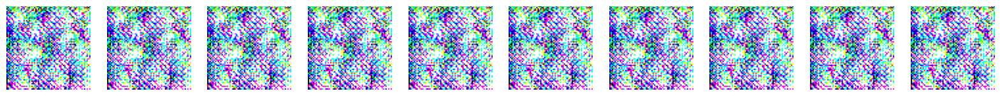

In [ ]:
import os
import warnings
import numpy as np
import matplotlib.pyplot as plt
from keras.optimizers import Adam
from keras.models import Sequential
from keras.layers import Dense, Conv2D, Conv2DTranspose, LeakyReLU
from keras.layers import BatchNormalization, Dropout, Reshape, Flatten
import tensorflow as tf

warnings.filterwarnings('ignore')

# 파일 경로 설정
checkpoint_path = '/content/drive/MyDrive/gan_checkpoint_epoch_18.h5'

# 파일 존재 여부 확인
if os.path.exists(checkpoint_path):
    print("파일이 존재합니다.")
else:
    print("파일이 존재하지 않습니다. 경로를 확인하세요.")

def build_discriminator(image_shape=(64, 64, 3)):
    model = Sequential()
    model.add(Conv2D(128, (3, 3), strides=(2,2), padding="same", input_shape=image_shape))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(128, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(256, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(256, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(512, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Flatten())
    model.add(Dropout(0.4))
    model.add(Dense(1, activation="sigmoid"))
    optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss="binary_crossentropy", optimizer=optimizer, metrics=["accuracy"])
    return model

def build_generator(latent_dim, channels=3):
    model = Sequential()
    model.add(Dense(16 * 16 * 128, input_dim=latent_dim))
    model.add(LeakyReLU(0.2))
    model.add(Reshape((16, 16, 128)))
    model.add(Conv2DTranspose(128, (4, 4), strides=(2, 2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(128, (4, 4), strides=(1, 1), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(64, (4, 4), strides=(2, 2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(64, (4, 4), strides=(1, 1), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(channels, (8, 8), activation='tanh', padding="same"))
    return model

def build_gan(generator, discriminator):
    discriminator.trainable = False
    model = Sequential()
    model.add(generator)
    model.add(discriminator)
    optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss="binary_crossentropy", optimizer=optimizer)
    return model

latent_dim = 100
generator_model = build_generator(latent_dim)
discriminator_model = build_discriminator()
gan_model = build_gan(generator_model, discriminator_model)

# 가중치 로드
if os.path.exists(checkpoint_path):
    print("Checkpoint 파일이 존재합니다.")
    gan_model.load_weights(checkpoint_path)
else:
    print("Checkpoint 파일이 존재하지 않습니다. 경로를 확인하세요.")

# 모델 사용 예시 (노이즈 샘플을 생성하여 이미지를 생성)
def generate_noise_samples(batch_size, latent_dim):
    return np.random.normal(0, 1, (batch_size, latent_dim))

# 노이즈 샘플 생성
noise_samples = generate_noise_samples(10, latent_dim)

# 생성된 이미지
generated_images = generator_model.predict(noise_samples)

# 생성된 이미지 시각화 (예시)
def plot_generated_images(images, n=10):
    plt.figure(figsize=(20, 4))
    for i in range(n):
        plt.subplot(1, n, i + 1)
        plt.imshow((images[i] + 1) / 2)  # 이미지 값을 0-1 범위로 스케일링
        plt.axis('off')
    plt.show()

# 생성된 이미지 플로팅
plot_generated_images(generated_images)


파일이 존재합니다.
Checkpoint 파일이 존재합니다.
1/1 [==============================] - 1s 1s/step


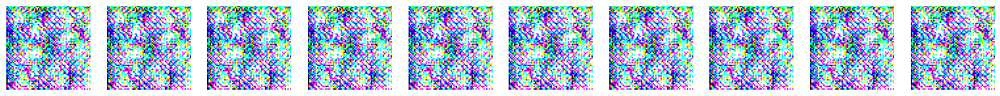

In [ ]:
import os
import warnings
import numpy as np
import matplotlib.pyplot as plt
from keras.optimizers import Adam
from keras.models import Sequential
from keras.layers import Dense, Conv2D, Conv2DTranspose, LeakyReLU
from keras.layers import BatchNormalization, Dropout, Reshape, Flatten
import tensorflow as tf

warnings.filterwarnings('ignore')

# 파일 경로 설정
checkpoint_path = '/content/drive/MyDrive/gan_checkpoint_epoch_19.h5'

# 파일 존재 여부 확인
if os.path.exists(checkpoint_path):
    print("파일이 존재합니다.")
else:
    print("파일이 존재하지 않습니다. 경로를 확인하세요.")

def build_discriminator(image_shape=(64, 64, 3)):
    model = Sequential()
    model.add(Conv2D(128, (3, 3), strides=(2,2), padding="same", input_shape=image_shape))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(128, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(256, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(256, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(512, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Flatten())
    model.add(Dropout(0.4))
    model.add(Dense(1, activation="sigmoid"))
    optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss="binary_crossentropy", optimizer=optimizer, metrics=["accuracy"])
    return model

def build_generator(latent_dim, channels=3):
    model = Sequential()
    model.add(Dense(16 * 16 * 128, input_dim=latent_dim))
    model.add(LeakyReLU(0.2))
    model.add(Reshape((16, 16, 128)))
    model.add(Conv2DTranspose(128, (4, 4), strides=(2, 2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(128, (4, 4), strides=(1, 1), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(64, (4, 4), strides=(2, 2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(64, (4, 4), strides=(1, 1), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(channels, (8, 8), activation='tanh', padding="same"))
    return model

def build_gan(generator, discriminator):
    discriminator.trainable = False
    model = Sequential()
    model.add(generator)
    model.add(discriminator)
    optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss="binary_crossentropy", optimizer=optimizer)
    return model

latent_dim = 100
generator_model = build_generator(latent_dim)
discriminator_model = build_discriminator()
gan_model = build_gan(generator_model, discriminator_model)

# 가중치 로드
if os.path.exists(checkpoint_path):
    print("Checkpoint 파일이 존재합니다.")
    gan_model.load_weights(checkpoint_path)
else:
    print("Checkpoint 파일이 존재하지 않습니다. 경로를 확인하세요.")

# 모델 사용 예시 (노이즈 샘플을 생성하여 이미지를 생성)
def generate_noise_samples(batch_size, latent_dim):
    return np.random.normal(0, 1, (batch_size, latent_dim))

# 노이즈 샘플 생성
noise_samples = generate_noise_samples(10, latent_dim)

# 생성된 이미지
generated_images = generator_model.predict(noise_samples)

# 생성된 이미지 시각화 (예시)
def plot_generated_images(images, n=10):
    plt.figure(figsize=(20, 4))
    for i in range(n):
        plt.subplot(1, n, i + 1)
        plt.imshow((images[i] + 1) / 2)  # 이미지 값을 0-1 범위로 스케일링
        plt.axis('off')
    plt.show()

# 생성된 이미지 플로팅
plot_generated_images(generated_images)


파일이 존재합니다.
Checkpoint 파일이 존재합니다.
1/1 [==============================] - 1s 995ms/step


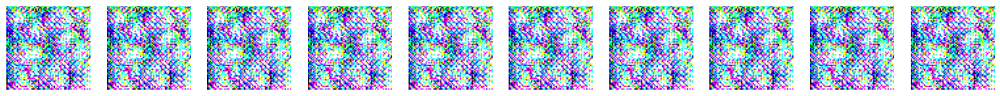

In [ ]:
import os
import warnings
import numpy as np
import matplotlib.pyplot as plt
from keras.optimizers import Adam
from keras.models import Sequential
from keras.layers import Dense, Conv2D, Conv2DTranspose, LeakyReLU
from keras.layers import BatchNormalization, Dropout, Reshape, Flatten
import tensorflow as tf

warnings.filterwarnings('ignore')

# 파일 경로 설정
checkpoint_path = '/content/drive/MyDrive/gan_checkpoint_epoch_20.h5'

# 파일 존재 여부 확인
if os.path.exists(checkpoint_path):
    print("파일이 존재합니다.")
else:
    print("파일이 존재하지 않습니다. 경로를 확인하세요.")

def build_discriminator(image_shape=(64, 64, 3)):
    model = Sequential()
    model.add(Conv2D(128, (3, 3), strides=(2,2), padding="same", input_shape=image_shape))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(128, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(256, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(256, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(512, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Flatten())
    model.add(Dropout(0.4))
    model.add(Dense(1, activation="sigmoid"))
    optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss="binary_crossentropy", optimizer=optimizer, metrics=["accuracy"])
    return model

def build_generator(latent_dim, channels=3):
    model = Sequential()
    model.add(Dense(16 * 16 * 128, input_dim=latent_dim))
    model.add(LeakyReLU(0.2))
    model.add(Reshape((16, 16, 128)))
    model.add(Conv2DTranspose(128, (4, 4), strides=(2, 2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(128, (4, 4), strides=(1, 1), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(64, (4, 4), strides=(2, 2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(64, (4, 4), strides=(1, 1), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(channels, (8, 8), activation='tanh', padding="same"))
    return model

def build_gan(generator, discriminator):
    discriminator.trainable = False
    model = Sequential()
    model.add(generator)
    model.add(discriminator)
    optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss="binary_crossentropy", optimizer=optimizer)
    return model

latent_dim = 100
generator_model = build_generator(latent_dim)
discriminator_model = build_discriminator()
gan_model = build_gan(generator_model, discriminator_model)

# 가중치 로드
if os.path.exists(checkpoint_path):
    print("Checkpoint 파일이 존재합니다.")
    gan_model.load_weights(checkpoint_path)
else:
    print("Checkpoint 파일이 존재하지 않습니다. 경로를 확인하세요.")

# 모델 사용 예시 (노이즈 샘플을 생성하여 이미지를 생성)
def generate_noise_samples(batch_size, latent_dim):
    return np.random.normal(0, 1, (batch_size, latent_dim))

# 노이즈 샘플 생성
noise_samples = generate_noise_samples(10, latent_dim)

# 생성된 이미지
generated_images = generator_model.predict(noise_samples)

# 생성된 이미지 시각화 (예시)
def plot_generated_images(images, n=10):
    plt.figure(figsize=(20, 4))
    for i in range(n):
        plt.subplot(1, n, i + 1)
        plt.imshow((images[i] + 1) / 2)  # 이미지 값을 0-1 범위로 스케일링
        plt.axis('off')
    plt.show()

# 생성된 이미지 플로팅
plot_generated_images(generated_images)


파일이 존재합니다.
Checkpoint 파일이 존재합니다.
1/1 [==============================] - 1s 592ms/step


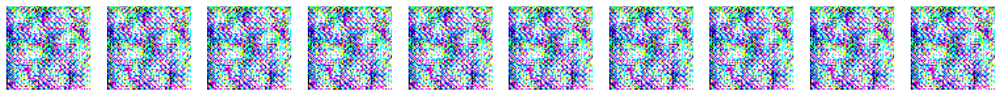

In [ ]:
import os
import warnings
import numpy as np
import matplotlib.pyplot as plt
from keras.optimizers import Adam
from keras.models import Sequential
from keras.layers import Dense, Conv2D, Conv2DTranspose, LeakyReLU
from keras.layers import BatchNormalization, Dropout, Reshape, Flatten
import tensorflow as tf

warnings.filterwarnings('ignore')

# 파일 경로 설정
checkpoint_path = '/content/drive/MyDrive/gan_checkpoint_epoch_21.h5'

# 파일 존재 여부 확인
if os.path.exists(checkpoint_path):
    print("파일이 존재합니다.")
else:
    print("파일이 존재하지 않습니다. 경로를 확인하세요.")

def build_discriminator(image_shape=(64, 64, 3)):
    model = Sequential()
    model.add(Conv2D(128, (3, 3), strides=(2,2), padding="same", input_shape=image_shape))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(128, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(256, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(256, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(512, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Flatten())
    model.add(Dropout(0.4))
    model.add(Dense(1, activation="sigmoid"))
    optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss="binary_crossentropy", optimizer=optimizer, metrics=["accuracy"])
    return model

def build_generator(latent_dim, channels=3):
    model = Sequential()
    model.add(Dense(16 * 16 * 128, input_dim=latent_dim))
    model.add(LeakyReLU(0.2))
    model.add(Reshape((16, 16, 128)))
    model.add(Conv2DTranspose(128, (4, 4), strides=(2, 2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(128, (4, 4), strides=(1, 1), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(64, (4, 4), strides=(2, 2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(64, (4, 4), strides=(1, 1), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(channels, (8, 8), activation='tanh', padding="same"))
    return model

def build_gan(generator, discriminator):
    discriminator.trainable = False
    model = Sequential()
    model.add(generator)
    model.add(discriminator)
    optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss="binary_crossentropy", optimizer=optimizer)
    return model

latent_dim = 100
generator_model = build_generator(latent_dim)
discriminator_model = build_discriminator()
gan_model = build_gan(generator_model, discriminator_model)

# 가중치 로드
if os.path.exists(checkpoint_path):
    print("Checkpoint 파일이 존재합니다.")
    gan_model.load_weights(checkpoint_path)
else:
    print("Checkpoint 파일이 존재하지 않습니다. 경로를 확인하세요.")

# 모델 사용 예시 (노이즈 샘플을 생성하여 이미지를 생성)
def generate_noise_samples(batch_size, latent_dim):
    return np.random.normal(0, 1, (batch_size, latent_dim))

# 노이즈 샘플 생성
noise_samples = generate_noise_samples(10, latent_dim)

# 생성된 이미지
generated_images = generator_model.predict(noise_samples)

# 생성된 이미지 시각화 (예시)
def plot_generated_images(images, n=10):
    plt.figure(figsize=(20, 4))
    for i in range(n):
        plt.subplot(1, n, i + 1)
        plt.imshow((images[i] + 1) / 2)  # 이미지 값을 0-1 범위로 스케일링
        plt.axis('off')
    plt.show()

# 생성된 이미지 플로팅
plot_generated_images(generated_images)


파일이 존재합니다.
Checkpoint 파일이 존재합니다.
1/1 [==============================] - 1s 1s/step


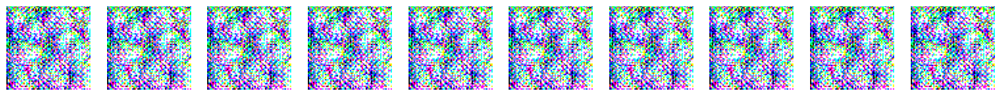

In [ ]:
import os
import warnings
import numpy as np
import matplotlib.pyplot as plt
from keras.optimizers import Adam
from keras.models import Sequential
from keras.layers import Dense, Conv2D, Conv2DTranspose, LeakyReLU
from keras.layers import BatchNormalization, Dropout, Reshape, Flatten
import tensorflow as tf

warnings.filterwarnings('ignore')

# 파일 경로 설정
checkpoint_path = '/content/drive/MyDrive/gan_checkpoint_epoch_22.h5'

# 파일 존재 여부 확인
if os.path.exists(checkpoint_path):
    print("파일이 존재합니다.")
else:
    print("파일이 존재하지 않습니다. 경로를 확인하세요.")

def build_discriminator(image_shape=(64, 64, 3)):
    model = Sequential()
    model.add(Conv2D(128, (3, 3), strides=(2,2), padding="same", input_shape=image_shape))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(128, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(256, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(256, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(512, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Flatten())
    model.add(Dropout(0.4))
    model.add(Dense(1, activation="sigmoid"))
    optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss="binary_crossentropy", optimizer=optimizer, metrics=["accuracy"])
    return model

def build_generator(latent_dim, channels=3):
    model = Sequential()
    model.add(Dense(16 * 16 * 128, input_dim=latent_dim))
    model.add(LeakyReLU(0.2))
    model.add(Reshape((16, 16, 128)))
    model.add(Conv2DTranspose(128, (4, 4), strides=(2, 2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(128, (4, 4), strides=(1, 1), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(64, (4, 4), strides=(2, 2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(64, (4, 4), strides=(1, 1), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(channels, (8, 8), activation='tanh', padding="same"))
    return model

def build_gan(generator, discriminator):
    discriminator.trainable = False
    model = Sequential()
    model.add(generator)
    model.add(discriminator)
    optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss="binary_crossentropy", optimizer=optimizer)
    return model

latent_dim = 100
generator_model = build_generator(latent_dim)
discriminator_model = build_discriminator()
gan_model = build_gan(generator_model, discriminator_model)

# 가중치 로드
if os.path.exists(checkpoint_path):
    print("Checkpoint 파일이 존재합니다.")
    gan_model.load_weights(checkpoint_path)
else:
    print("Checkpoint 파일이 존재하지 않습니다. 경로를 확인하세요.")

# 모델 사용 예시 (노이즈 샘플을 생성하여 이미지를 생성)
def generate_noise_samples(batch_size, latent_dim):
    return np.random.normal(0, 1, (batch_size, latent_dim))

# 노이즈 샘플 생성
noise_samples = generate_noise_samples(10, latent_dim)

# 생성된 이미지
generated_images = generator_model.predict(noise_samples)

# 생성된 이미지 시각화 (예시)
def plot_generated_images(images, n=10):
    plt.figure(figsize=(20, 4))
    for i in range(n):
        plt.subplot(1, n, i + 1)
        plt.imshow((images[i] + 1) / 2)  # 이미지 값을 0-1 범위로 스케일링
        plt.axis('off')
    plt.show()

# 생성된 이미지 플로팅
plot_generated_images(generated_images)


파일이 존재합니다.
Checkpoint 파일이 존재합니다.
1/1 [==============================] - 1s 668ms/step


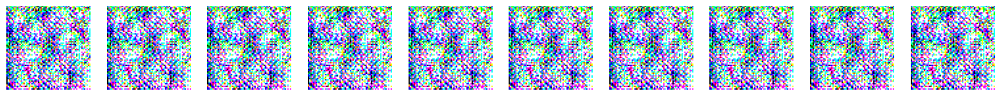

In [ ]:
import os
import warnings
import numpy as np
import matplotlib.pyplot as plt
from keras.optimizers import Adam
from keras.models import Sequential
from keras.layers import Dense, Conv2D, Conv2DTranspose, LeakyReLU
from keras.layers import BatchNormalization, Dropout, Reshape, Flatten
import tensorflow as tf

warnings.filterwarnings('ignore')

# 파일 경로 설정
checkpoint_path = '/content/drive/MyDrive/gan_checkpoint_epoch_23.h5'

# 파일 존재 여부 확인
if os.path.exists(checkpoint_path):
    print("파일이 존재합니다.")
else:
    print("파일이 존재하지 않습니다. 경로를 확인하세요.")

def build_discriminator(image_shape=(64, 64, 3)):
    model = Sequential()
    model.add(Conv2D(128, (3, 3), strides=(2,2), padding="same", input_shape=image_shape))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(128, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(256, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(256, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(512, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Flatten())
    model.add(Dropout(0.4))
    model.add(Dense(1, activation="sigmoid"))
    optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss="binary_crossentropy", optimizer=optimizer, metrics=["accuracy"])
    return model

def build_generator(latent_dim, channels=3):
    model = Sequential()
    model.add(Dense(16 * 16 * 128, input_dim=latent_dim))
    model.add(LeakyReLU(0.2))
    model.add(Reshape((16, 16, 128)))
    model.add(Conv2DTranspose(128, (4, 4), strides=(2, 2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(128, (4, 4), strides=(1, 1), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(64, (4, 4), strides=(2, 2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(64, (4, 4), strides=(1, 1), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(channels, (8, 8), activation='tanh', padding="same"))
    return model

def build_gan(generator, discriminator):
    discriminator.trainable = False
    model = Sequential()
    model.add(generator)
    model.add(discriminator)
    optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss="binary_crossentropy", optimizer=optimizer)
    return model

latent_dim = 100
generator_model = build_generator(latent_dim)
discriminator_model = build_discriminator()
gan_model = build_gan(generator_model, discriminator_model)

# 가중치 로드
if os.path.exists(checkpoint_path):
    print("Checkpoint 파일이 존재합니다.")
    gan_model.load_weights(checkpoint_path)
else:
    print("Checkpoint 파일이 존재하지 않습니다. 경로를 확인하세요.")

# 모델 사용 예시 (노이즈 샘플을 생성하여 이미지를 생성)
def generate_noise_samples(batch_size, latent_dim):
    return np.random.normal(0, 1, (batch_size, latent_dim))

# 노이즈 샘플 생성
noise_samples = generate_noise_samples(10, latent_dim)

# 생성된 이미지
generated_images = generator_model.predict(noise_samples)

# 생성된 이미지 시각화 (예시)
def plot_generated_images(images, n=10):
    plt.figure(figsize=(20, 4))
    for i in range(n):
        plt.subplot(1, n, i + 1)
        plt.imshow((images[i] + 1) / 2)  # 이미지 값을 0-1 범위로 스케일링
        plt.axis('off')
    plt.show()

# 생성된 이미지 플로팅
plot_generated_images(generated_images)


파일이 존재합니다.
Checkpoint 파일이 존재합니다.
1/1 [==============================] - 1s 1s/step


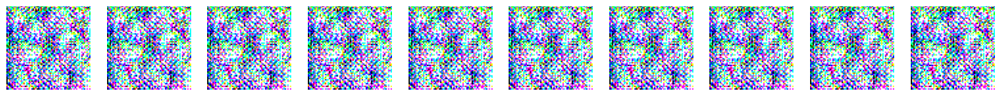

In [ ]:
import os
import warnings
import numpy as np
import matplotlib.pyplot as plt
from keras.optimizers import Adam
from keras.models import Sequential
from keras.layers import Dense, Conv2D, Conv2DTranspose, LeakyReLU
from keras.layers import BatchNormalization, Dropout, Reshape, Flatten
import tensorflow as tf

warnings.filterwarnings('ignore')

# 파일 경로 설정
checkpoint_path = '/content/drive/MyDrive/gan_checkpoint_epoch_24.h5'

# 파일 존재 여부 확인
if os.path.exists(checkpoint_path):
    print("파일이 존재합니다.")
else:
    print("파일이 존재하지 않습니다. 경로를 확인하세요.")

def build_discriminator(image_shape=(64, 64, 3)):
    model = Sequential()
    model.add(Conv2D(128, (3, 3), strides=(2,2), padding="same", input_shape=image_shape))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(128, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(256, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(256, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(512, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Flatten())
    model.add(Dropout(0.4))
    model.add(Dense(1, activation="sigmoid"))
    optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss="binary_crossentropy", optimizer=optimizer, metrics=["accuracy"])
    return model

def build_generator(latent_dim, channels=3):
    model = Sequential()
    model.add(Dense(16 * 16 * 128, input_dim=latent_dim))
    model.add(LeakyReLU(0.2))
    model.add(Reshape((16, 16, 128)))
    model.add(Conv2DTranspose(128, (4, 4), strides=(2, 2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(128, (4, 4), strides=(1, 1), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(64, (4, 4), strides=(2, 2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(64, (4, 4), strides=(1, 1), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(channels, (8, 8), activation='tanh', padding="same"))
    return model

def build_gan(generator, discriminator):
    discriminator.trainable = False
    model = Sequential()
    model.add(generator)
    model.add(discriminator)
    optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss="binary_crossentropy", optimizer=optimizer)
    return model

latent_dim = 100
generator_model = build_generator(latent_dim)
discriminator_model = build_discriminator()
gan_model = build_gan(generator_model, discriminator_model)

# 가중치 로드
if os.path.exists(checkpoint_path):
    print("Checkpoint 파일이 존재합니다.")
    gan_model.load_weights(checkpoint_path)
else:
    print("Checkpoint 파일이 존재하지 않습니다. 경로를 확인하세요.")

# 모델 사용 예시 (노이즈 샘플을 생성하여 이미지를 생성)
def generate_noise_samples(batch_size, latent_dim):
    return np.random.normal(0, 1, (batch_size, latent_dim))

# 노이즈 샘플 생성
noise_samples = generate_noise_samples(10, latent_dim)

# 생성된 이미지
generated_images = generator_model.predict(noise_samples)

# 생성된 이미지 시각화 (예시)
def plot_generated_images(images, n=10):
    plt.figure(figsize=(20, 4))
    for i in range(n):
        plt.subplot(1, n, i + 1)
        plt.imshow((images[i] + 1) / 2)  # 이미지 값을 0-1 범위로 스케일링
        plt.axis('off')
    plt.show()

# 생성된 이미지 플로팅
plot_generated_images(generated_images)


파일이 존재합니다.
Checkpoint 파일이 존재합니다.
1/1 [==============================] - 1s 1s/step


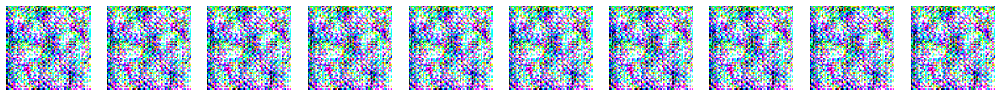

In [ ]:
import os
import warnings
import numpy as np
import matplotlib.pyplot as plt
from keras.optimizers import Adam
from keras.models import Sequential
from keras.layers import Dense, Conv2D, Conv2DTranspose, LeakyReLU
from keras.layers import BatchNormalization, Dropout, Reshape, Flatten
import tensorflow as tf

warnings.filterwarnings('ignore')

# 파일 경로 설정
checkpoint_path = '/content/drive/MyDrive/gan_checkpoint_epoch_25.h5'

# 파일 존재 여부 확인
if os.path.exists(checkpoint_path):
    print("파일이 존재합니다.")
else:
    print("파일이 존재하지 않습니다. 경로를 확인하세요.")

def build_discriminator(image_shape=(64, 64, 3)):
    model = Sequential()
    model.add(Conv2D(128, (3, 3), strides=(2,2), padding="same", input_shape=image_shape))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(128, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(256, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(256, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(512, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Flatten())
    model.add(Dropout(0.4))
    model.add(Dense(1, activation="sigmoid"))
    optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss="binary_crossentropy", optimizer=optimizer, metrics=["accuracy"])
    return model

def build_generator(latent_dim, channels=3):
    model = Sequential()
    model.add(Dense(16 * 16 * 128, input_dim=latent_dim))
    model.add(LeakyReLU(0.2))
    model.add(Reshape((16, 16, 128)))
    model.add(Conv2DTranspose(128, (4, 4), strides=(2, 2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(128, (4, 4), strides=(1, 1), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(64, (4, 4), strides=(2, 2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(64, (4, 4), strides=(1, 1), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(channels, (8, 8), activation='tanh', padding="same"))
    return model

def build_gan(generator, discriminator):
    discriminator.trainable = False
    model = Sequential()
    model.add(generator)
    model.add(discriminator)
    optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss="binary_crossentropy", optimizer=optimizer)
    return model

latent_dim = 100
generator_model = build_generator(latent_dim)
discriminator_model = build_discriminator()
gan_model = build_gan(generator_model, discriminator_model)

# 가중치 로드
if os.path.exists(checkpoint_path):
    print("Checkpoint 파일이 존재합니다.")
    gan_model.load_weights(checkpoint_path)
else:
    print("Checkpoint 파일이 존재하지 않습니다. 경로를 확인하세요.")

# 모델 사용 예시 (노이즈 샘플을 생성하여 이미지를 생성)
def generate_noise_samples(batch_size, latent_dim):
    return np.random.normal(0, 1, (batch_size, latent_dim))

# 노이즈 샘플 생성
noise_samples = generate_noise_samples(10, latent_dim)

# 생성된 이미지
generated_images = generator_model.predict(noise_samples)

# 생성된 이미지 시각화 (예시)
def plot_generated_images(images, n=10):
    plt.figure(figsize=(20, 4))
    for i in range(n):
        plt.subplot(1, n, i + 1)
        plt.imshow((images[i] + 1) / 2)  # 이미지 값을 0-1 범위로 스케일링
        plt.axis('off')
    plt.show()

# 생성된 이미지 플로팅
plot_generated_images(generated_images)


파일이 존재합니다.
Checkpoint 파일이 존재합니다.
1/1 [==============================] - 1s 901ms/step


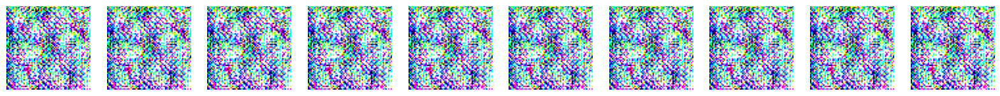

In [ ]:
import os
import warnings
import numpy as np
import matplotlib.pyplot as plt
from keras.optimizers import Adam
from keras.models import Sequential
from keras.layers import Dense, Conv2D, Conv2DTranspose, LeakyReLU
from keras.layers import BatchNormalization, Dropout, Reshape, Flatten
import tensorflow as tf

warnings.filterwarnings('ignore')

# 파일 경로 설정
checkpoint_path = '/content/drive/MyDrive/gan_checkpoint_epoch_26.h5'

# 파일 존재 여부 확인
if os.path.exists(checkpoint_path):
    print("파일이 존재합니다.")
else:
    print("파일이 존재하지 않습니다. 경로를 확인하세요.")

def build_discriminator(image_shape=(64, 64, 3)):
    model = Sequential()
    model.add(Conv2D(128, (3, 3), strides=(2,2), padding="same", input_shape=image_shape))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(128, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(256, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(256, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(512, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Flatten())
    model.add(Dropout(0.4))
    model.add(Dense(1, activation="sigmoid"))
    optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss="binary_crossentropy", optimizer=optimizer, metrics=["accuracy"])
    return model

def build_generator(latent_dim, channels=3):
    model = Sequential()
    model.add(Dense(16 * 16 * 128, input_dim=latent_dim))
    model.add(LeakyReLU(0.2))
    model.add(Reshape((16, 16, 128)))
    model.add(Conv2DTranspose(128, (4, 4), strides=(2, 2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(128, (4, 4), strides=(1, 1), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(64, (4, 4), strides=(2, 2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(64, (4, 4), strides=(1, 1), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(channels, (8, 8), activation='tanh', padding="same"))
    return model

def build_gan(generator, discriminator):
    discriminator.trainable = False
    model = Sequential()
    model.add(generator)
    model.add(discriminator)
    optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss="binary_crossentropy", optimizer=optimizer)
    return model

latent_dim = 100
generator_model = build_generator(latent_dim)
discriminator_model = build_discriminator()
gan_model = build_gan(generator_model, discriminator_model)

# 가중치 로드
if os.path.exists(checkpoint_path):
    print("Checkpoint 파일이 존재합니다.")
    gan_model.load_weights(checkpoint_path)
else:
    print("Checkpoint 파일이 존재하지 않습니다. 경로를 확인하세요.")

# 모델 사용 예시 (노이즈 샘플을 생성하여 이미지를 생성)
def generate_noise_samples(batch_size, latent_dim):
    return np.random.normal(0, 1, (batch_size, latent_dim))

# 노이즈 샘플 생성
noise_samples = generate_noise_samples(10, latent_dim)

# 생성된 이미지
generated_images = generator_model.predict(noise_samples)

# 생성된 이미지 시각화 (예시)
def plot_generated_images(images, n=10):
    plt.figure(figsize=(20, 4))
    for i in range(n):
        plt.subplot(1, n, i + 1)
        plt.imshow((images[i] + 1) / 2)  # 이미지 값을 0-1 범위로 스케일링
        plt.axis('off')
    plt.show()

# 생성된 이미지 플로팅
plot_generated_images(generated_images)


파일이 존재합니다.
Checkpoint 파일이 존재합니다.
1/1 [==============================] - 2s 2s/step


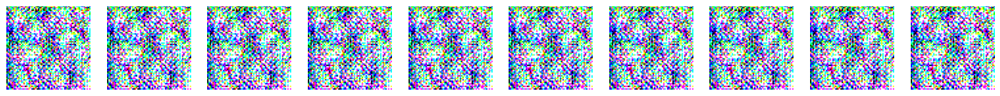

In [ ]:
import os
import warnings
import numpy as np
import matplotlib.pyplot as plt
from keras.optimizers import Adam
from keras.models import Sequential
from keras.layers import Dense, Conv2D, Conv2DTranspose, LeakyReLU
from keras.layers import BatchNormalization, Dropout, Reshape, Flatten
import tensorflow as tf

warnings.filterwarnings('ignore')

# 파일 경로 설정
checkpoint_path = '/content/drive/MyDrive/gan_checkpoint_epoch_27.h5'

# 파일 존재 여부 확인
if os.path.exists(checkpoint_path):
    print("파일이 존재합니다.")
else:
    print("파일이 존재하지 않습니다. 경로를 확인하세요.")

def build_discriminator(image_shape=(64, 64, 3)):
    model = Sequential()
    model.add(Conv2D(128, (3, 3), strides=(2,2), padding="same", input_shape=image_shape))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(128, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(256, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(256, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(512, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Flatten())
    model.add(Dropout(0.4))
    model.add(Dense(1, activation="sigmoid"))
    optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss="binary_crossentropy", optimizer=optimizer, metrics=["accuracy"])
    return model

def build_generator(latent_dim, channels=3):
    model = Sequential()
    model.add(Dense(16 * 16 * 128, input_dim=latent_dim))
    model.add(LeakyReLU(0.2))
    model.add(Reshape((16, 16, 128)))
    model.add(Conv2DTranspose(128, (4, 4), strides=(2, 2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(128, (4, 4), strides=(1, 1), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(64, (4, 4), strides=(2, 2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(64, (4, 4), strides=(1, 1), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(channels, (8, 8), activation='tanh', padding="same"))
    return model

def build_gan(generator, discriminator):
    discriminator.trainable = False
    model = Sequential()
    model.add(generator)
    model.add(discriminator)
    optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss="binary_crossentropy", optimizer=optimizer)
    return model

latent_dim = 100
generator_model = build_generator(latent_dim)
discriminator_model = build_discriminator()
gan_model = build_gan(generator_model, discriminator_model)

# 가중치 로드
if os.path.exists(checkpoint_path):
    print("Checkpoint 파일이 존재합니다.")
    gan_model.load_weights(checkpoint_path)
else:
    print("Checkpoint 파일이 존재하지 않습니다. 경로를 확인하세요.")

# 모델 사용 예시 (노이즈 샘플을 생성하여 이미지를 생성)
def generate_noise_samples(batch_size, latent_dim):
    return np.random.normal(0, 1, (batch_size, latent_dim))

# 노이즈 샘플 생성
noise_samples = generate_noise_samples(10, latent_dim)

# 생성된 이미지
generated_images = generator_model.predict(noise_samples)

# 생성된 이미지 시각화 (예시)
def plot_generated_images(images, n=10):
    plt.figure(figsize=(20, 4))
    for i in range(n):
        plt.subplot(1, n, i + 1)
        plt.imshow((images[i] + 1) / 2)  # 이미지 값을 0-1 범위로 스케일링
        plt.axis('off')
    plt.show()

# 생성된 이미지 플로팅
plot_generated_images(generated_images)


파일이 존재합니다.
Checkpoint 파일이 존재합니다.
1/1 [==============================] - 1s 1s/step


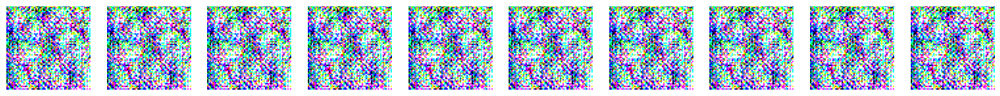

In [ ]:
import os
import warnings
import numpy as np
import matplotlib.pyplot as plt
from keras.optimizers import Adam
from keras.models import Sequential
from keras.layers import Dense, Conv2D, Conv2DTranspose, LeakyReLU
from keras.layers import BatchNormalization, Dropout, Reshape, Flatten
import tensorflow as tf

warnings.filterwarnings('ignore')

# 파일 경로 설정
checkpoint_path = '/content/drive/MyDrive/gan_checkpoint_epoch_28.h5'

# 파일 존재 여부 확인
if os.path.exists(checkpoint_path):
    print("파일이 존재합니다.")
else:
    print("파일이 존재하지 않습니다. 경로를 확인하세요.")

def build_discriminator(image_shape=(64, 64, 3)):
    model = Sequential()
    model.add(Conv2D(128, (3, 3), strides=(2,2), padding="same", input_shape=image_shape))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(128, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(256, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(256, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(512, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Flatten())
    model.add(Dropout(0.4))
    model.add(Dense(1, activation="sigmoid"))
    optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss="binary_crossentropy", optimizer=optimizer, metrics=["accuracy"])
    return model

def build_generator(latent_dim, channels=3):
    model = Sequential()
    model.add(Dense(16 * 16 * 128, input_dim=latent_dim))
    model.add(LeakyReLU(0.2))
    model.add(Reshape((16, 16, 128)))
    model.add(Conv2DTranspose(128, (4, 4), strides=(2, 2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(128, (4, 4), strides=(1, 1), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(64, (4, 4), strides=(2, 2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(64, (4, 4), strides=(1, 1), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(channels, (8, 8), activation='tanh', padding="same"))
    return model

def build_gan(generator, discriminator):
    discriminator.trainable = False
    model = Sequential()
    model.add(generator)
    model.add(discriminator)
    optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss="binary_crossentropy", optimizer=optimizer)
    return model

latent_dim = 100
generator_model = build_generator(latent_dim)
discriminator_model = build_discriminator()
gan_model = build_gan(generator_model, discriminator_model)

# 가중치 로드
if os.path.exists(checkpoint_path):
    print("Checkpoint 파일이 존재합니다.")
    gan_model.load_weights(checkpoint_path)
else:
    print("Checkpoint 파일이 존재하지 않습니다. 경로를 확인하세요.")

# 모델 사용 예시 (노이즈 샘플을 생성하여 이미지를 생성)
def generate_noise_samples(batch_size, latent_dim):
    return np.random.normal(0, 1, (batch_size, latent_dim))

# 노이즈 샘플 생성
noise_samples = generate_noise_samples(10, latent_dim)

# 생성된 이미지
generated_images = generator_model.predict(noise_samples)

# 생성된 이미지 시각화 (예시)
def plot_generated_images(images, n=10):
    plt.figure(figsize=(20, 4))
    for i in range(n):
        plt.subplot(1, n, i + 1)
        plt.imshow((images[i] + 1) / 2)  # 이미지 값을 0-1 범위로 스케일링
        plt.axis('off')
    plt.show()

# 생성된 이미지 플로팅
plot_generated_images(generated_images)


파일이 존재합니다.
Checkpoint 파일이 존재합니다.
1/1 [==============================] - 1s 896ms/step


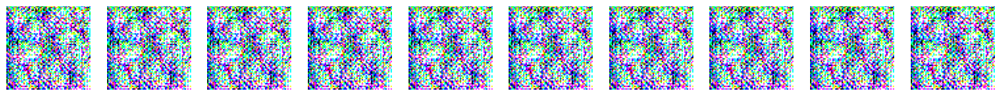

In [ ]:
import os
import warnings
import numpy as np
import matplotlib.pyplot as plt
from keras.optimizers import Adam
from keras.models import Sequential
from keras.layers import Dense, Conv2D, Conv2DTranspose, LeakyReLU
from keras.layers import BatchNormalization, Dropout, Reshape, Flatten
import tensorflow as tf

warnings.filterwarnings('ignore')

# 파일 경로 설정
checkpoint_path = '/content/drive/MyDrive/gan_checkpoint_epoch_29.h5'

# 파일 존재 여부 확인
if os.path.exists(checkpoint_path):
    print("파일이 존재합니다.")
else:
    print("파일이 존재하지 않습니다. 경로를 확인하세요.")

def build_discriminator(image_shape=(64, 64, 3)):
    model = Sequential()
    model.add(Conv2D(128, (3, 3), strides=(2,2), padding="same", input_shape=image_shape))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(128, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(256, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(256, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(512, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Flatten())
    model.add(Dropout(0.4))
    model.add(Dense(1, activation="sigmoid"))
    optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss="binary_crossentropy", optimizer=optimizer, metrics=["accuracy"])
    return model

def build_generator(latent_dim, channels=3):
    model = Sequential()
    model.add(Dense(16 * 16 * 128, input_dim=latent_dim))
    model.add(LeakyReLU(0.2))
    model.add(Reshape((16, 16, 128)))
    model.add(Conv2DTranspose(128, (4, 4), strides=(2, 2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(128, (4, 4), strides=(1, 1), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(64, (4, 4), strides=(2, 2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(64, (4, 4), strides=(1, 1), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(channels, (8, 8), activation='tanh', padding="same"))
    return model

def build_gan(generator, discriminator):
    discriminator.trainable = False
    model = Sequential()
    model.add(generator)
    model.add(discriminator)
    optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss="binary_crossentropy", optimizer=optimizer)
    return model

latent_dim = 100
generator_model = build_generator(latent_dim)
discriminator_model = build_discriminator()
gan_model = build_gan(generator_model, discriminator_model)

# 가중치 로드
if os.path.exists(checkpoint_path):
    print("Checkpoint 파일이 존재합니다.")
    gan_model.load_weights(checkpoint_path)
else:
    print("Checkpoint 파일이 존재하지 않습니다. 경로를 확인하세요.")

# 모델 사용 예시 (노이즈 샘플을 생성하여 이미지를 생성)
def generate_noise_samples(batch_size, latent_dim):
    return np.random.normal(0, 1, (batch_size, latent_dim))

# 노이즈 샘플 생성
noise_samples = generate_noise_samples(10, latent_dim)

# 생성된 이미지
generated_images = generator_model.predict(noise_samples)

# 생성된 이미지 시각화 (예시)
def plot_generated_images(images, n=10):
    plt.figure(figsize=(20, 4))
    for i in range(n):
        plt.subplot(1, n, i + 1)
        plt.imshow((images[i] + 1) / 2)  # 이미지 값을 0-1 범위로 스케일링
        plt.axis('off')
    plt.show()

# 생성된 이미지 플로팅
plot_generated_images(generated_images)


파일이 존재합니다.
Checkpoint 파일이 존재합니다.
1/1 [==============================] - 1s 881ms/step


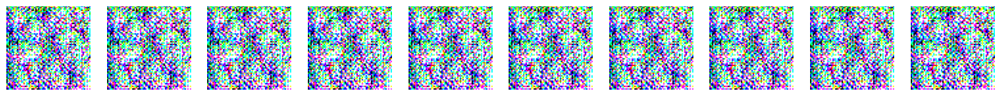

In [ ]:
import os
import warnings
import numpy as np
import matplotlib.pyplot as plt
from keras.optimizers import Adam
from keras.models import Sequential
from keras.layers import Dense, Conv2D, Conv2DTranspose, LeakyReLU
from keras.layers import BatchNormalization, Dropout, Reshape, Flatten
import tensorflow as tf

warnings.filterwarnings('ignore')

# 파일 경로 설정
checkpoint_path = '/content/drive/MyDrive/gan_checkpoint_epoch_30.h5'

# 파일 존재 여부 확인
if os.path.exists(checkpoint_path):
    print("파일이 존재합니다.")
else:
    print("파일이 존재하지 않습니다. 경로를 확인하세요.")

def build_discriminator(image_shape=(64, 64, 3)):
    model = Sequential()
    model.add(Conv2D(128, (3, 3), strides=(2,2), padding="same", input_shape=image_shape))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(128, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(256, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(256, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(512, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Flatten())
    model.add(Dropout(0.4))
    model.add(Dense(1, activation="sigmoid"))
    optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss="binary_crossentropy", optimizer=optimizer, metrics=["accuracy"])
    return model

def build_generator(latent_dim, channels=3):
    model = Sequential()
    model.add(Dense(16 * 16 * 128, input_dim=latent_dim))
    model.add(LeakyReLU(0.2))
    model.add(Reshape((16, 16, 128)))
    model.add(Conv2DTranspose(128, (4, 4), strides=(2, 2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(128, (4, 4), strides=(1, 1), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(64, (4, 4), strides=(2, 2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(64, (4, 4), strides=(1, 1), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(channels, (8, 8), activation='tanh', padding="same"))
    return model

def build_gan(generator, discriminator):
    discriminator.trainable = False
    model = Sequential()
    model.add(generator)
    model.add(discriminator)
    optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss="binary_crossentropy", optimizer=optimizer)
    return model

latent_dim = 100
generator_model = build_generator(latent_dim)
discriminator_model = build_discriminator()
gan_model = build_gan(generator_model, discriminator_model)

# 가중치 로드
if os.path.exists(checkpoint_path):
    print("Checkpoint 파일이 존재합니다.")
    gan_model.load_weights(checkpoint_path)
else:
    print("Checkpoint 파일이 존재하지 않습니다. 경로를 확인하세요.")

# 모델 사용 예시 (노이즈 샘플을 생성하여 이미지를 생성)
def generate_noise_samples(batch_size, latent_dim):
    return np.random.normal(0, 1, (batch_size, latent_dim))

# 노이즈 샘플 생성
noise_samples = generate_noise_samples(10, latent_dim)

# 생성된 이미지
generated_images = generator_model.predict(noise_samples)

# 생성된 이미지 시각화 (예시)
def plot_generated_images(images, n=10):
    plt.figure(figsize=(20, 4))
    for i in range(n):
        plt.subplot(1, n, i + 1)
        plt.imshow((images[i] + 1) / 2)  # 이미지 값을 0-1 범위로 스케일링
        plt.axis('off')
    plt.show()

# 생성된 이미지 플로팅
plot_generated_images(generated_images)


파일이 존재합니다.
Checkpoint 파일이 존재합니다.
1/1 [==============================] - 1s 876ms/step


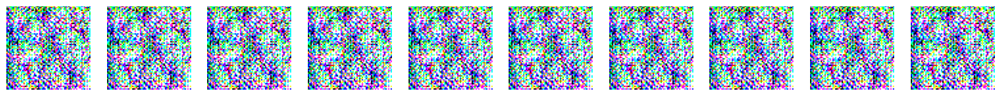

In [ ]:
import os
import warnings
import numpy as np
import matplotlib.pyplot as plt
from keras.optimizers import Adam
from keras.models import Sequential
from keras.layers import Dense, Conv2D, Conv2DTranspose, LeakyReLU
from keras.layers import BatchNormalization, Dropout, Reshape, Flatten
import tensorflow as tf

warnings.filterwarnings('ignore')

# 파일 경로 설정
checkpoint_path = '/content/drive/MyDrive/gan_checkpoint_epoch_31.h5'

# 파일 존재 여부 확인
if os.path.exists(checkpoint_path):
    print("파일이 존재합니다.")
else:
    print("파일이 존재하지 않습니다. 경로를 확인하세요.")

def build_discriminator(image_shape=(64, 64, 3)):
    model = Sequential()
    model.add(Conv2D(128, (3, 3), strides=(2,2), padding="same", input_shape=image_shape))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(128, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(256, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(256, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(512, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Flatten())
    model.add(Dropout(0.4))
    model.add(Dense(1, activation="sigmoid"))
    optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss="binary_crossentropy", optimizer=optimizer, metrics=["accuracy"])
    return model

def build_generator(latent_dim, channels=3):
    model = Sequential()
    model.add(Dense(16 * 16 * 128, input_dim=latent_dim))
    model.add(LeakyReLU(0.2))
    model.add(Reshape((16, 16, 128)))
    model.add(Conv2DTranspose(128, (4, 4), strides=(2, 2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(128, (4, 4), strides=(1, 1), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(64, (4, 4), strides=(2, 2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(64, (4, 4), strides=(1, 1), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(channels, (8, 8), activation='tanh', padding="same"))
    return model

def build_gan(generator, discriminator):
    discriminator.trainable = False
    model = Sequential()
    model.add(generator)
    model.add(discriminator)
    optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss="binary_crossentropy", optimizer=optimizer)
    return model

latent_dim = 100
generator_model = build_generator(latent_dim)
discriminator_model = build_discriminator()
gan_model = build_gan(generator_model, discriminator_model)

# 가중치 로드
if os.path.exists(checkpoint_path):
    print("Checkpoint 파일이 존재합니다.")
    gan_model.load_weights(checkpoint_path)
else:
    print("Checkpoint 파일이 존재하지 않습니다. 경로를 확인하세요.")

# 모델 사용 예시 (노이즈 샘플을 생성하여 이미지를 생성)
def generate_noise_samples(batch_size, latent_dim):
    return np.random.normal(0, 1, (batch_size, latent_dim))

# 노이즈 샘플 생성
noise_samples = generate_noise_samples(10, latent_dim)

# 생성된 이미지
generated_images = generator_model.predict(noise_samples)

# 생성된 이미지 시각화 (예시)
def plot_generated_images(images, n=10):
    plt.figure(figsize=(20, 4))
    for i in range(n):
        plt.subplot(1, n, i + 1)
        plt.imshow((images[i] + 1) / 2)  # 이미지 값을 0-1 범위로 스케일링
        plt.axis('off')
    plt.show()

# 생성된 이미지 플로팅
plot_generated_images(generated_images)


파일이 존재합니다.
Checkpoint 파일이 존재합니다.
1/1 [==============================] - 2s 2s/step


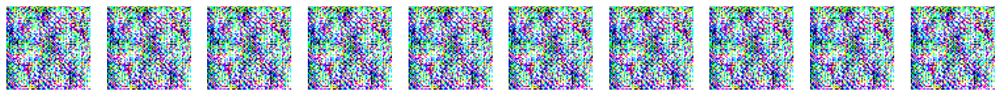

In [ ]:
import os
import warnings
import numpy as np
import matplotlib.pyplot as plt
from keras.optimizers import Adam
from keras.models import Sequential
from keras.layers import Dense, Conv2D, Conv2DTranspose, LeakyReLU
from keras.layers import BatchNormalization, Dropout, Reshape, Flatten
import tensorflow as tf

warnings.filterwarnings('ignore')

# 파일 경로 설정
checkpoint_path = '/content/drive/MyDrive/gan_checkpoint_epoch_32.h5'

# 파일 존재 여부 확인
if os.path.exists(checkpoint_path):
    print("파일이 존재합니다.")
else:
    print("파일이 존재하지 않습니다. 경로를 확인하세요.")

def build_discriminator(image_shape=(64, 64, 3)):
    model = Sequential()
    model.add(Conv2D(128, (3, 3), strides=(2,2), padding="same", input_shape=image_shape))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(128, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(256, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(256, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(512, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Flatten())
    model.add(Dropout(0.4))
    model.add(Dense(1, activation="sigmoid"))
    optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss="binary_crossentropy", optimizer=optimizer, metrics=["accuracy"])
    return model

def build_generator(latent_dim, channels=3):
    model = Sequential()
    model.add(Dense(16 * 16 * 128, input_dim=latent_dim))
    model.add(LeakyReLU(0.2))
    model.add(Reshape((16, 16, 128)))
    model.add(Conv2DTranspose(128, (4, 4), strides=(2, 2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(128, (4, 4), strides=(1, 1), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(64, (4, 4), strides=(2, 2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(64, (4, 4), strides=(1, 1), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(channels, (8, 8), activation='tanh', padding="same"))
    return model

def build_gan(generator, discriminator):
    discriminator.trainable = False
    model = Sequential()
    model.add(generator)
    model.add(discriminator)
    optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss="binary_crossentropy", optimizer=optimizer)
    return model

latent_dim = 100
generator_model = build_generator(latent_dim)
discriminator_model = build_discriminator()
gan_model = build_gan(generator_model, discriminator_model)

# 가중치 로드
if os.path.exists(checkpoint_path):
    print("Checkpoint 파일이 존재합니다.")
    gan_model.load_weights(checkpoint_path)
else:
    print("Checkpoint 파일이 존재하지 않습니다. 경로를 확인하세요.")

# 모델 사용 예시 (노이즈 샘플을 생성하여 이미지를 생성)
def generate_noise_samples(batch_size, latent_dim):
    return np.random.normal(0, 1, (batch_size, latent_dim))

# 노이즈 샘플 생성
noise_samples = generate_noise_samples(10, latent_dim)

# 생성된 이미지
generated_images = generator_model.predict(noise_samples)

# 생성된 이미지 시각화 (예시)
def plot_generated_images(images, n=10):
    plt.figure(figsize=(20, 4))
    for i in range(n):
        plt.subplot(1, n, i + 1)
        plt.imshow((images[i] + 1) / 2)  # 이미지 값을 0-1 범위로 스케일링
        plt.axis('off')
    plt.show()

# 생성된 이미지 플로팅
plot_generated_images(generated_images)


파일이 존재합니다.
Checkpoint 파일이 존재합니다.
1/1 [==============================] - 1s 1s/step


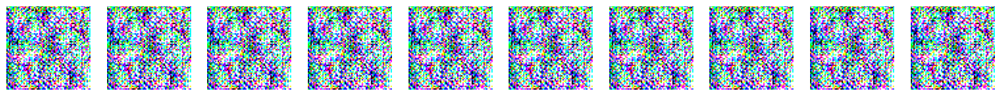

In [ ]:
import os
import warnings
import numpy as np
import matplotlib.pyplot as plt
from keras.optimizers import Adam
from keras.models import Sequential
from keras.layers import Dense, Conv2D, Conv2DTranspose, LeakyReLU
from keras.layers import BatchNormalization, Dropout, Reshape, Flatten
import tensorflow as tf

warnings.filterwarnings('ignore')

# 파일 경로 설정
checkpoint_path = '/content/drive/MyDrive/gan_checkpoint_epoch_33.h5'

# 파일 존재 여부 확인
if os.path.exists(checkpoint_path):
    print("파일이 존재합니다.")
else:
    print("파일이 존재하지 않습니다. 경로를 확인하세요.")

def build_discriminator(image_shape=(64, 64, 3)):
    model = Sequential()
    model.add(Conv2D(128, (3, 3), strides=(2,2), padding="same", input_shape=image_shape))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(128, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(256, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(256, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(512, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Flatten())
    model.add(Dropout(0.4))
    model.add(Dense(1, activation="sigmoid"))
    optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss="binary_crossentropy", optimizer=optimizer, metrics=["accuracy"])
    return model

def build_generator(latent_dim, channels=3):
    model = Sequential()
    model.add(Dense(16 * 16 * 128, input_dim=latent_dim))
    model.add(LeakyReLU(0.2))
    model.add(Reshape((16, 16, 128)))
    model.add(Conv2DTranspose(128, (4, 4), strides=(2, 2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(128, (4, 4), strides=(1, 1), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(64, (4, 4), strides=(2, 2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(64, (4, 4), strides=(1, 1), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(channels, (8, 8), activation='tanh', padding="same"))
    return model

def build_gan(generator, discriminator):
    discriminator.trainable = False
    model = Sequential()
    model.add(generator)
    model.add(discriminator)
    optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss="binary_crossentropy", optimizer=optimizer)
    return model

latent_dim = 100
generator_model = build_generator(latent_dim)
discriminator_model = build_discriminator()
gan_model = build_gan(generator_model, discriminator_model)

# 가중치 로드
if os.path.exists(checkpoint_path):
    print("Checkpoint 파일이 존재합니다.")
    gan_model.load_weights(checkpoint_path)
else:
    print("Checkpoint 파일이 존재하지 않습니다. 경로를 확인하세요.")

# 모델 사용 예시 (노이즈 샘플을 생성하여 이미지를 생성)
def generate_noise_samples(batch_size, latent_dim):
    return np.random.normal(0, 1, (batch_size, latent_dim))

# 노이즈 샘플 생성
noise_samples = generate_noise_samples(10, latent_dim)

# 생성된 이미지
generated_images = generator_model.predict(noise_samples)

# 생성된 이미지 시각화 (예시)
def plot_generated_images(images, n=10):
    plt.figure(figsize=(20, 4))
    for i in range(n):
        plt.subplot(1, n, i + 1)
        plt.imshow((images[i] + 1) / 2)  # 이미지 값을 0-1 범위로 스케일링
        plt.axis('off')
    plt.show()

# 생성된 이미지 플로팅
plot_generated_images(generated_images)


파일이 존재합니다.
Checkpoint 파일이 존재합니다.
1/1 [==============================] - 1s 796ms/step


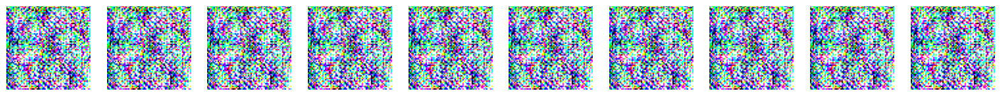

In [ ]:
import os
import warnings
import numpy as np
import matplotlib.pyplot as plt
from keras.optimizers import Adam
from keras.models import Sequential
from keras.layers import Dense, Conv2D, Conv2DTranspose, LeakyReLU
from keras.layers import BatchNormalization, Dropout, Reshape, Flatten
import tensorflow as tf

warnings.filterwarnings('ignore')

# 파일 경로 설정
checkpoint_path = '/content/drive/MyDrive/gan_checkpoint_epoch_34.h5'

# 파일 존재 여부 확인
if os.path.exists(checkpoint_path):
    print("파일이 존재합니다.")
else:
    print("파일이 존재하지 않습니다. 경로를 확인하세요.")

def build_discriminator(image_shape=(64, 64, 3)):
    model = Sequential()
    model.add(Conv2D(128, (3, 3), strides=(2,2), padding="same", input_shape=image_shape))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(128, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(256, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(256, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(512, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Flatten())
    model.add(Dropout(0.4))
    model.add(Dense(1, activation="sigmoid"))
    optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss="binary_crossentropy", optimizer=optimizer, metrics=["accuracy"])
    return model

def build_generator(latent_dim, channels=3):
    model = Sequential()
    model.add(Dense(16 * 16 * 128, input_dim=latent_dim))
    model.add(LeakyReLU(0.2))
    model.add(Reshape((16, 16, 128)))
    model.add(Conv2DTranspose(128, (4, 4), strides=(2, 2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(128, (4, 4), strides=(1, 1), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(64, (4, 4), strides=(2, 2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(64, (4, 4), strides=(1, 1), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(channels, (8, 8), activation='tanh', padding="same"))
    return model

def build_gan(generator, discriminator):
    discriminator.trainable = False
    model = Sequential()
    model.add(generator)
    model.add(discriminator)
    optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss="binary_crossentropy", optimizer=optimizer)
    return model

latent_dim = 100
generator_model = build_generator(latent_dim)
discriminator_model = build_discriminator()
gan_model = build_gan(generator_model, discriminator_model)

# 가중치 로드
if os.path.exists(checkpoint_path):
    print("Checkpoint 파일이 존재합니다.")
    gan_model.load_weights(checkpoint_path)
else:
    print("Checkpoint 파일이 존재하지 않습니다. 경로를 확인하세요.")

# 모델 사용 예시 (노이즈 샘플을 생성하여 이미지를 생성)
def generate_noise_samples(batch_size, latent_dim):
    return np.random.normal(0, 1, (batch_size, latent_dim))

# 노이즈 샘플 생성
noise_samples = generate_noise_samples(10, latent_dim)

# 생성된 이미지
generated_images = generator_model.predict(noise_samples)

# 생성된 이미지 시각화 (예시)
def plot_generated_images(images, n=10):
    plt.figure(figsize=(20, 4))
    for i in range(n):
        plt.subplot(1, n, i + 1)
        plt.imshow((images[i] + 1) / 2)  # 이미지 값을 0-1 범위로 스케일링
        plt.axis('off')
    plt.show()

# 생성된 이미지 플로팅
plot_generated_images(generated_images)


파일이 존재합니다.
Checkpoint 파일이 존재합니다.
1/1 [==============================] - 1s 860ms/step


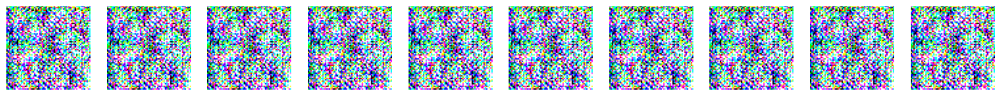

In [ ]:
import os
import warnings
import numpy as np
import matplotlib.pyplot as plt
from keras.optimizers import Adam
from keras.models import Sequential
from keras.layers import Dense, Conv2D, Conv2DTranspose, LeakyReLU
from keras.layers import BatchNormalization, Dropout, Reshape, Flatten
import tensorflow as tf

warnings.filterwarnings('ignore')

# 파일 경로 설정
checkpoint_path = '/content/drive/MyDrive/gan_checkpoint_epoch_35.h5'

# 파일 존재 여부 확인
if os.path.exists(checkpoint_path):
    print("파일이 존재합니다.")
else:
    print("파일이 존재하지 않습니다. 경로를 확인하세요.")

def build_discriminator(image_shape=(64, 64, 3)):
    model = Sequential()
    model.add(Conv2D(128, (3, 3), strides=(2,2), padding="same", input_shape=image_shape))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(128, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(256, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(256, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(512, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Flatten())
    model.add(Dropout(0.4))
    model.add(Dense(1, activation="sigmoid"))
    optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss="binary_crossentropy", optimizer=optimizer, metrics=["accuracy"])
    return model

def build_generator(latent_dim, channels=3):
    model = Sequential()
    model.add(Dense(16 * 16 * 128, input_dim=latent_dim))
    model.add(LeakyReLU(0.2))
    model.add(Reshape((16, 16, 128)))
    model.add(Conv2DTranspose(128, (4, 4), strides=(2, 2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(128, (4, 4), strides=(1, 1), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(64, (4, 4), strides=(2, 2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(64, (4, 4), strides=(1, 1), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(channels, (8, 8), activation='tanh', padding="same"))
    return model

def build_gan(generator, discriminator):
    discriminator.trainable = False
    model = Sequential()
    model.add(generator)
    model.add(discriminator)
    optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss="binary_crossentropy", optimizer=optimizer)
    return model

latent_dim = 100
generator_model = build_generator(latent_dim)
discriminator_model = build_discriminator()
gan_model = build_gan(generator_model, discriminator_model)

# 가중치 로드
if os.path.exists(checkpoint_path):
    print("Checkpoint 파일이 존재합니다.")
    gan_model.load_weights(checkpoint_path)
else:
    print("Checkpoint 파일이 존재하지 않습니다. 경로를 확인하세요.")

# 모델 사용 예시 (노이즈 샘플을 생성하여 이미지를 생성)
def generate_noise_samples(batch_size, latent_dim):
    return np.random.normal(0, 1, (batch_size, latent_dim))

# 노이즈 샘플 생성
noise_samples = generate_noise_samples(10, latent_dim)

# 생성된 이미지
generated_images = generator_model.predict(noise_samples)

# 생성된 이미지 시각화 (예시)
def plot_generated_images(images, n=10):
    plt.figure(figsize=(20, 4))
    for i in range(n):
        plt.subplot(1, n, i + 1)
        plt.imshow((images[i] + 1) / 2)  # 이미지 값을 0-1 범위로 스케일링
        plt.axis('off')
    plt.show()

# 생성된 이미지 플로팅
plot_generated_images(generated_images)


파일이 존재합니다.
Checkpoint 파일이 존재합니다.
1/1 [==============================] - 1s 1s/step


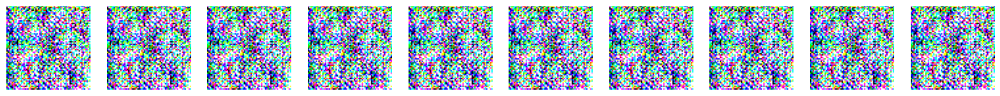

In [ ]:
import os
import warnings
import numpy as np
import matplotlib.pyplot as plt
from keras.optimizers import Adam
from keras.models import Sequential
from keras.layers import Dense, Conv2D, Conv2DTranspose, LeakyReLU
from keras.layers import BatchNormalization, Dropout, Reshape, Flatten
import tensorflow as tf

warnings.filterwarnings('ignore')

# 파일 경로 설정
checkpoint_path = '/content/drive/MyDrive/gan_checkpoint_epoch_36.h5'

# 파일 존재 여부 확인
if os.path.exists(checkpoint_path):
    print("파일이 존재합니다.")
else:
    print("파일이 존재하지 않습니다. 경로를 확인하세요.")

def build_discriminator(image_shape=(64, 64, 3)):
    model = Sequential()
    model.add(Conv2D(128, (3, 3), strides=(2,2), padding="same", input_shape=image_shape))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(128, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(256, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(256, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(512, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Flatten())
    model.add(Dropout(0.4))
    model.add(Dense(1, activation="sigmoid"))
    optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss="binary_crossentropy", optimizer=optimizer, metrics=["accuracy"])
    return model

def build_generator(latent_dim, channels=3):
    model = Sequential()
    model.add(Dense(16 * 16 * 128, input_dim=latent_dim))
    model.add(LeakyReLU(0.2))
    model.add(Reshape((16, 16, 128)))
    model.add(Conv2DTranspose(128, (4, 4), strides=(2, 2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(128, (4, 4), strides=(1, 1), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(64, (4, 4), strides=(2, 2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(64, (4, 4), strides=(1, 1), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(channels, (8, 8), activation='tanh', padding="same"))
    return model

def build_gan(generator, discriminator):
    discriminator.trainable = False
    model = Sequential()
    model.add(generator)
    model.add(discriminator)
    optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss="binary_crossentropy", optimizer=optimizer)
    return model

latent_dim = 100
generator_model = build_generator(latent_dim)
discriminator_model = build_discriminator()
gan_model = build_gan(generator_model, discriminator_model)

# 가중치 로드
if os.path.exists(checkpoint_path):
    print("Checkpoint 파일이 존재합니다.")
    gan_model.load_weights(checkpoint_path)
else:
    print("Checkpoint 파일이 존재하지 않습니다. 경로를 확인하세요.")

# 모델 사용 예시 (노이즈 샘플을 생성하여 이미지를 생성)
def generate_noise_samples(batch_size, latent_dim):
    return np.random.normal(0, 1, (batch_size, latent_dim))

# 노이즈 샘플 생성
noise_samples = generate_noise_samples(10, latent_dim)

# 생성된 이미지
generated_images = generator_model.predict(noise_samples)

# 생성된 이미지 시각화 (예시)
def plot_generated_images(images, n=10):
    plt.figure(figsize=(20, 4))
    for i in range(n):
        plt.subplot(1, n, i + 1)
        plt.imshow((images[i] + 1) / 2)  # 이미지 값을 0-1 범위로 스케일링
        plt.axis('off')
    plt.show()

# 생성된 이미지 플로팅
plot_generated_images(generated_images)


파일이 존재합니다.
Checkpoint 파일이 존재합니다.
1/1 [==============================] - 1s 794ms/step


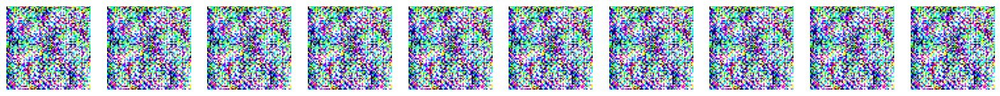

In [ ]:
import os
import warnings
import numpy as np
import matplotlib.pyplot as plt
from keras.optimizers import Adam
from keras.models import Sequential
from keras.layers import Dense, Conv2D, Conv2DTranspose, LeakyReLU
from keras.layers import BatchNormalization, Dropout, Reshape, Flatten
import tensorflow as tf

warnings.filterwarnings('ignore')

# 파일 경로 설정
checkpoint_path = '/content/drive/MyDrive/gan_checkpoint_epoch_37.h5'

# 파일 존재 여부 확인
if os.path.exists(checkpoint_path):
    print("파일이 존재합니다.")
else:
    print("파일이 존재하지 않습니다. 경로를 확인하세요.")

def build_discriminator(image_shape=(64, 64, 3)):
    model = Sequential()
    model.add(Conv2D(128, (3, 3), strides=(2,2), padding="same", input_shape=image_shape))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(128, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(256, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(256, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(512, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Flatten())
    model.add(Dropout(0.4))
    model.add(Dense(1, activation="sigmoid"))
    optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss="binary_crossentropy", optimizer=optimizer, metrics=["accuracy"])
    return model

def build_generator(latent_dim, channels=3):
    model = Sequential()
    model.add(Dense(16 * 16 * 128, input_dim=latent_dim))
    model.add(LeakyReLU(0.2))
    model.add(Reshape((16, 16, 128)))
    model.add(Conv2DTranspose(128, (4, 4), strides=(2, 2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(128, (4, 4), strides=(1, 1), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(64, (4, 4), strides=(2, 2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(64, (4, 4), strides=(1, 1), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(channels, (8, 8), activation='tanh', padding="same"))
    return model

def build_gan(generator, discriminator):
    discriminator.trainable = False
    model = Sequential()
    model.add(generator)
    model.add(discriminator)
    optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss="binary_crossentropy", optimizer=optimizer)
    return model

latent_dim = 100
generator_model = build_generator(latent_dim)
discriminator_model = build_discriminator()
gan_model = build_gan(generator_model, discriminator_model)

# 가중치 로드
if os.path.exists(checkpoint_path):
    print("Checkpoint 파일이 존재합니다.")
    gan_model.load_weights(checkpoint_path)
else:
    print("Checkpoint 파일이 존재하지 않습니다. 경로를 확인하세요.")

# 모델 사용 예시 (노이즈 샘플을 생성하여 이미지를 생성)
def generate_noise_samples(batch_size, latent_dim):
    return np.random.normal(0, 1, (batch_size, latent_dim))

# 노이즈 샘플 생성
noise_samples = generate_noise_samples(10, latent_dim)

# 생성된 이미지
generated_images = generator_model.predict(noise_samples)

# 생성된 이미지 시각화 (예시)
def plot_generated_images(images, n=10):
    plt.figure(figsize=(20, 4))
    for i in range(n):
        plt.subplot(1, n, i + 1)
        plt.imshow((images[i] + 1) / 2)  # 이미지 값을 0-1 범위로 스케일링
        plt.axis('off')
    plt.show()

# 생성된 이미지 플로팅
plot_generated_images(generated_images)


파일이 존재합니다.
Checkpoint 파일이 존재합니다.
1/1 [==============================] - 2s 2s/step


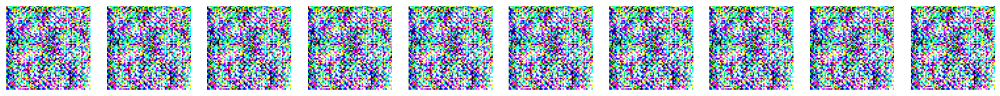

In [ ]:
import os
import warnings
import numpy as np
import matplotlib.pyplot as plt
from keras.optimizers import Adam
from keras.models import Sequential
from keras.layers import Dense, Conv2D, Conv2DTranspose, LeakyReLU
from keras.layers import BatchNormalization, Dropout, Reshape, Flatten
import tensorflow as tf

warnings.filterwarnings('ignore')

# 파일 경로 설정
checkpoint_path = '/content/drive/MyDrive/gan_checkpoint_epoch_38.h5'

# 파일 존재 여부 확인
if os.path.exists(checkpoint_path):
    print("파일이 존재합니다.")
else:
    print("파일이 존재하지 않습니다. 경로를 확인하세요.")

def build_discriminator(image_shape=(64, 64, 3)):
    model = Sequential()
    model.add(Conv2D(128, (3, 3), strides=(2,2), padding="same", input_shape=image_shape))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(128, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(256, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(256, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(512, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Flatten())
    model.add(Dropout(0.4))
    model.add(Dense(1, activation="sigmoid"))
    optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss="binary_crossentropy", optimizer=optimizer, metrics=["accuracy"])
    return model

def build_generator(latent_dim, channels=3):
    model = Sequential()
    model.add(Dense(16 * 16 * 128, input_dim=latent_dim))
    model.add(LeakyReLU(0.2))
    model.add(Reshape((16, 16, 128)))
    model.add(Conv2DTranspose(128, (4, 4), strides=(2, 2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(128, (4, 4), strides=(1, 1), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(64, (4, 4), strides=(2, 2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(64, (4, 4), strides=(1, 1), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(channels, (8, 8), activation='tanh', padding="same"))
    return model

def build_gan(generator, discriminator):
    discriminator.trainable = False
    model = Sequential()
    model.add(generator)
    model.add(discriminator)
    optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss="binary_crossentropy", optimizer=optimizer)
    return model

latent_dim = 100
generator_model = build_generator(latent_dim)
discriminator_model = build_discriminator()
gan_model = build_gan(generator_model, discriminator_model)

# 가중치 로드
if os.path.exists(checkpoint_path):
    print("Checkpoint 파일이 존재합니다.")
    gan_model.load_weights(checkpoint_path)
else:
    print("Checkpoint 파일이 존재하지 않습니다. 경로를 확인하세요.")

# 모델 사용 예시 (노이즈 샘플을 생성하여 이미지를 생성)
def generate_noise_samples(batch_size, latent_dim):
    return np.random.normal(0, 1, (batch_size, latent_dim))

# 노이즈 샘플 생성
noise_samples = generate_noise_samples(10, latent_dim)

# 생성된 이미지
generated_images = generator_model.predict(noise_samples)

# 생성된 이미지 시각화 (예시)
def plot_generated_images(images, n=10):
    plt.figure(figsize=(20, 4))
    for i in range(n):
        plt.subplot(1, n, i + 1)
        plt.imshow((images[i] + 1) / 2)  # 이미지 값을 0-1 범위로 스케일링
        plt.axis('off')
    plt.show()

# 생성된 이미지 플로팅
plot_generated_images(generated_images)


파일이 존재합니다.
Checkpoint 파일이 존재합니다.
1/1 [==============================] - 1s 930ms/step


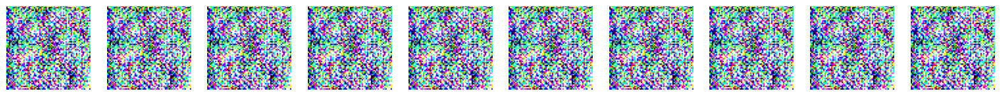

In [ ]:
import os
import warnings
import numpy as np
import matplotlib.pyplot as plt
from keras.optimizers import Adam
from keras.models import Sequential
from keras.layers import Dense, Conv2D, Conv2DTranspose, LeakyReLU
from keras.layers import BatchNormalization, Dropout, Reshape, Flatten
import tensorflow as tf

warnings.filterwarnings('ignore')

# 파일 경로 설정
checkpoint_path = '/content/drive/MyDrive/gan_checkpoint_epoch_39.h5'

# 파일 존재 여부 확인
if os.path.exists(checkpoint_path):
    print("파일이 존재합니다.")
else:
    print("파일이 존재하지 않습니다. 경로를 확인하세요.")

def build_discriminator(image_shape=(64, 64, 3)):
    model = Sequential()
    model.add(Conv2D(128, (3, 3), strides=(2,2), padding="same", input_shape=image_shape))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(128, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(256, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(256, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(512, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Flatten())
    model.add(Dropout(0.4))
    model.add(Dense(1, activation="sigmoid"))
    optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss="binary_crossentropy", optimizer=optimizer, metrics=["accuracy"])
    return model

def build_generator(latent_dim, channels=3):
    model = Sequential()
    model.add(Dense(16 * 16 * 128, input_dim=latent_dim))
    model.add(LeakyReLU(0.2))
    model.add(Reshape((16, 16, 128)))
    model.add(Conv2DTranspose(128, (4, 4), strides=(2, 2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(128, (4, 4), strides=(1, 1), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(64, (4, 4), strides=(2, 2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(64, (4, 4), strides=(1, 1), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(channels, (8, 8), activation='tanh', padding="same"))
    return model

def build_gan(generator, discriminator):
    discriminator.trainable = False
    model = Sequential()
    model.add(generator)
    model.add(discriminator)
    optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss="binary_crossentropy", optimizer=optimizer)
    return model

latent_dim = 100
generator_model = build_generator(latent_dim)
discriminator_model = build_discriminator()
gan_model = build_gan(generator_model, discriminator_model)

# 가중치 로드
if os.path.exists(checkpoint_path):
    print("Checkpoint 파일이 존재합니다.")
    gan_model.load_weights(checkpoint_path)
else:
    print("Checkpoint 파일이 존재하지 않습니다. 경로를 확인하세요.")

# 모델 사용 예시 (노이즈 샘플을 생성하여 이미지를 생성)
def generate_noise_samples(batch_size, latent_dim):
    return np.random.normal(0, 1, (batch_size, latent_dim))

# 노이즈 샘플 생성
noise_samples = generate_noise_samples(10, latent_dim)

# 생성된 이미지
generated_images = generator_model.predict(noise_samples)

# 생성된 이미지 시각화 (예시)
def plot_generated_images(images, n=10):
    plt.figure(figsize=(20, 4))
    for i in range(n):
        plt.subplot(1, n, i + 1)
        plt.imshow((images[i] + 1) / 2)  # 이미지 값을 0-1 범위로 스케일링
        plt.axis('off')
    plt.show()

# 생성된 이미지 플로팅
plot_generated_images(generated_images)


파일이 존재합니다.
Checkpoint 파일이 존재합니다.
1/1 [==============================] - 1s 956ms/step


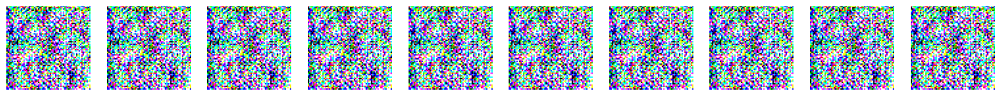

In [ ]:
import os
import warnings
import numpy as np
import matplotlib.pyplot as plt
from keras.optimizers import Adam
from keras.models import Sequential
from keras.layers import Dense, Conv2D, Conv2DTranspose, LeakyReLU
from keras.layers import BatchNormalization, Dropout, Reshape, Flatten
import tensorflow as tf

warnings.filterwarnings('ignore')

# 파일 경로 설정
checkpoint_path = '/content/drive/MyDrive/gan_checkpoint_epoch_40.h5'

# 파일 존재 여부 확인
if os.path.exists(checkpoint_path):
    print("파일이 존재합니다.")
else:
    print("파일이 존재하지 않습니다. 경로를 확인하세요.")

def build_discriminator(image_shape=(64, 64, 3)):
    model = Sequential()
    model.add(Conv2D(128, (3, 3), strides=(2,2), padding="same", input_shape=image_shape))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(128, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(256, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(256, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(512, (3, 3), strides=(2,2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Flatten())
    model.add(Dropout(0.4))
    model.add(Dense(1, activation="sigmoid"))
    optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss="binary_crossentropy", optimizer=optimizer, metrics=["accuracy"])
    return model

def build_generator(latent_dim, channels=3):
    model = Sequential()
    model.add(Dense(16 * 16 * 128, input_dim=latent_dim))
    model.add(LeakyReLU(0.2))
    model.add(Reshape((16, 16, 128)))
    model.add(Conv2DTranspose(128, (4, 4), strides=(2, 2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(128, (4, 4), strides=(1, 1), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(64, (4, 4), strides=(2, 2), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2DTranspose(64, (4, 4), strides=(1, 1), padding="same"))
    model.add(LeakyReLU(0.2))
    model.add(Conv2D(channels, (8, 8), activation='tanh', padding="same"))
    return model

def build_gan(generator, discriminator):
    discriminator.trainable = False
    model = Sequential()
    model.add(generator)
    model.add(discriminator)
    optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss="binary_crossentropy", optimizer=optimizer)
    return model

latent_dim = 100
generator_model = build_generator(latent_dim)
discriminator_model = build_discriminator()
gan_model = build_gan(generator_model, discriminator_model)

# 가중치 로드
if os.path.exists(checkpoint_path):
    print("Checkpoint 파일이 존재합니다.")
    gan_model.load_weights(checkpoint_path)
else:
    print("Checkpoint 파일이 존재하지 않습니다. 경로를 확인하세요.")

# 모델 사용 예시 (노이즈 샘플을 생성하여 이미지를 생성)
def generate_noise_samples(batch_size, latent_dim):
    return np.random.normal(0, 1, (batch_size, latent_dim))

# 노이즈 샘플 생성
noise_samples = generate_noise_samples(10, latent_dim)

# 생성된 이미지
generated_images = generator_model.predict(noise_samples)

# 생성된 이미지 시각화 (예시)
def plot_generated_images(images, n=10):
    plt.figure(figsize=(20, 4))
    for i in range(n):
        plt.subplot(1, n, i + 1)
        plt.imshow((images[i] + 1) / 2)  # 이미지 값을 0-1 범위로 스케일링
        plt.axis('off')
    plt.show()

# 생성된 이미지 플로팅
plot_generated_images(generated_images)